## Telekom Müştəri Analizi
Mobil şəbəkəmizdə xidmət istifadəsini artırmağın necə planlaşdırılacağını öyrənmək üçün multisim istifadə tərəfindən təyin edilən abunələri müəyyənləşdirməyə marağlıyıq.

Multisimmer, müştəri o deməkdir ki, eyni zamanda bir neçə operatorun xidmətlərindən istifadə edir.

Sizinlə multisimmer.parquet veri faylı təqdim edilib və bu fayl əsasında müştərilərin multisim istifadəsi tərəfindən ehtimal təxminləri təmin edən bir klasifikasiya növündə ML modeli qurmağınızı tələb edirik. Ehtimal eşik dərəcəsi __0.5__ olmalıdır.

Məxfilik məsələləri səbəbindən təmin edilmiş abunə kimlikləri və bəzi sütun adları maskalanmışdır.

Maskalanan sütun adları belə göstərilir: __var1, var2 ... .__

### Maskalanmayan sütunların təsviri

1) subscriber_id: hər bir abunəçinin unikal id nömrəsi 
2) trf: abunəçinin aktivləşdirilmiş tarifinin etiketlə kodlanmış adı\n
3) age: illərlə abunəçi yaşı\n
4) gndr: abunəçinin cinsi: M – kişi üçün, F – qadın üçün, U – naməlum üçün
5) tenure: günlərlə abunəçinin qalma müddəti
6) dev_man: abunəçinin cihazının istehsalçı adı
7) device_os_name: abunəçinin cihazının OS tipli istehsalı
8) is_dualsim:  1 - cihaz dulasim variantını dəstəkləyirsə, 0 - yoxsa
9) is_featurephone: 1 - cihaz funksiyalı telefon növüdürsə, 0 - deyilsə
10) is_smartphone: 1 - əgər cihaz smartfon növüdürsə, 0 - deyilsə
11) simcard_type: sim kartın texnologiya növü
11) region: abunəçi bölgəsinin etiket kodlu adı
12) target: 1 - abunəçi multisimmerdirsə, 0 - abunəçi yalnız bizim xidmətlərimizdən istifadə edirsə

# Kitabxanalar

In [13]:
import pandas as pd
import numpy as np
from math import ceil
import missingno as msn
import matplotlib.pyplot as plt
import plotly.graph_objects as go
import seaborn as sns
import plotly.express as px
from ycimpute.imputer import knnimput
from matplotlib import colors
from matplotlib.ticker import PercentFormatter
from plotly.subplots import make_subplots
from warnings import filterwarnings
from sklearn.impute import KNNImputer
from lazypredict.Supervised import LazyClassifier
from sklearn.model_selection import train_test_split,StratifiedKFold,cross_val_score,GridSearchCV
from sklearn.preprocessing import StandardScaler,MinMaxScaler
from sklearn.metrics import confusion_matrix,accuracy_score,classification_report,roc_curve, auc
from sklearn.preprocessing import LabelEncoder
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier
from datetime import date
import plotly.offline as pyo
pyo.init_notebook_mode(connected=True)
filterwarnings("ignore")
pd.set_option('display.max_colwidth', None)
pd.set_option('display.max_rows', 500)
pd.set_option('display.max_columns', 500)
pd.set_option('display.width', 1000)
%matplotlib inline

## Datanı oxuyuruq

In [14]:
pd.read_parquet("task.parquet").to_csv('task.csv')

*Datamızı __csv__ formatına çeviririk.*

In [15]:
dataframe = pd.read_csv('task.csv')

In [16]:
#dataya ön baxış
dataframe.head()

,Unnamed: 0,subscriber_id,trf,age,gndr,tenure,var_5,dev_man,device_os_name,var_8,is_dualsim,is_featurephone,is_smartphone,simcard_type,var_13,var_14,var_15,var_16,var_17,var_18,var_19,var_20,var_21,var_22,var_23,var_24,var_25,var_26,var_27,var_28,var_29,var_30,var_31,var_32,var_33,var_34,var_35,var_36,var_37,var_38,var_39,var_40,var_41,var_42,var_43,var_44,var_45,var_46,var_47,var_48,var_49,var_50,var_51,var_52,var_53,var_54,var_55,var_56,var_57,var_58,var_59,var_60,var_61,var_62,var_63,var_64,var_65,var_66,var_67,var_68,var_69,var_70,var_71,var_72,region,var_74,var_75,var_76,var_77,var_78,var_79,var_80,var_81,var_82,var_83,var_84,var_85,var_86,var_87,var_88,var_89,var_90,var_91,var_92,var_93,var_94,var_95,var_96,var_97,var_98,var_99,var_100,var_101,var_102,var_103,var_104,var_105,var_106,var_107,var_108,var_109,var_110,var_111,var_112,var_113,var_114,var_115,var_116,var_117,var_118,var_119,var_120,var_121,var_122,var_123,var_124,var_125,var_126,var_127,var_128,var_129,var_130,var_131,var_132,var_133,var_134,var_135,var_136,var_137,var_138,var_139,var_140,var_141,var_142,var_143,var_144,var_145,var_146,var_147,var_148,var_149,var_150,var_151,var_152,var_153,var_154,var_155,var_156,var_157,var_158,var_159,var_160,var_161,var_162,var_163,var_164,var_165,var_166,var_167,var_168,var_169,var_170,var_171,var_172,var_173,var_174,var_175,var_176,var_177,var_178,var_179,var_180,var_181,var_182,var_183,var_184,var_185,var_186,var_187,var_188,var_189,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199,var_200,target,var_202,var_203,var_204,var_205,var_206,var_207,var_208,var_209,var_210,is_bundle_trf
0,0,6961546617278,2,64.00,M,6384.00,1507,Samsung,Android OS,1,1.00,0.00,1.00,4G,298.00,678.00,1080.00,2008.00,276.20,669.20,978.50,1892.60,74.50,84.75,90.00,83.67,0.90,1.00,0.90,0.90,112.00,281.00,485.00,912.00,127.00,299.30,455.80,913.00,28.00,35.13,40.42,38.00,1.10,1.10,0.90,1.00,4.00,9.00,13.00,24.00,4.50,8.00,10.50,22.20,1.00,1.13,1.08,1.00,1.10,0.90,0.80,0.90,40.00,93.00,152.00,272.00,396.36,710.90,831.14,1014.69,11.33,25.36,35.68,62.64,1,0.00,NaN,5.20,12.00,27.00,36.00,57.00,4.00,9.00,12.00,19.00,0.00,0.00,0.00,0.00,0,0,0,0,0,0,0,0,131.50,0,0,0,396,3,0,0,0,0,0,0,0,0,0,0,0,89,0,0,0,18,58,42,0,15.00,7.62,0.14,0,0,0,0,0,0,0,0,0.00,3.00,0.00,0.00,0,0.00,0,0.00,0,0.00,64,0.00,3,0.00,0.29,6.88,0.05,0.24,0.00,0.00,0.00,0.00,0.00,0.00,3.00,0.00,0,0.55,1,0.00,0,0.00,190,4.80,12,0.00,0.78,24.39,0.10,0.68,0.04,0.00,0.00,0.22,0.00,0.00,9.00,0.00,0,2.20,4,0.00,0,0.00,383,41.40,17,0.00,1.52,44.16,0.15,1.34,0.04,0.00,0.00,0.22,0.00,0.00,0,0,0,3.00,9.00,0,0,15.00,0,0,0
1,1,6961536724304,16,35.00,M,6180.00,565,Samsung,Android OS,1,1.00,0.00,1.00,NaN,484.00,998.00,1559.00,3072.00,668.90,1285.60,2139.70,4185.60,121.00,124.75,129.92,128.00,1.40,1.30,1.40,1.40,245.00,526.00,806.00,1643.00,302.50,631.00,1017.00,2132.20,61.25,65.75,67.17,68.46,1.20,1.20,1.30,1.30,19.00,58.00,86.00,156.00,21.50,66.40,108.20,193.50,4.75,7.25,7.17,6.50,1.10,1.10,1.30,1.20,34.00,70.00,116.00,242.00,53.85,2247.46,4182.41,9356.48,10.01,30.00,51.98,97.54,0,0.00,NaN,12.20,10.00,20.00,50.00,95.00,1.00,2.00,4.00,9.00,0.00,0.00,0.00,0.00,0,0,0,0,0,0,0,0,324.00,0,0,0,0,53,53,0,0,0,0,0,0,0,42,0,0,0,0,0,0,0,0,0,0,2.00,0.75,0.05,0,0,0,0,0,0,0,0,0.00,0.00,0.00,0.00,0,0.00,0,0.00,0,0.00,8,0.00,0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0,8.80,9,10.00,0,0.00,54,8.70,1,0.00,0.00,0.78,0.00,0.00,0.14,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0,10.23,14,11.00,0,0.00,126,15.30,3,0.00,0.12,3.84,0.06,0.00,3.09,0.10,0.00,0.00,0.00,0.00,0,0,0,0.00,0.00,0,0,2.00,2,0,1
2,2,6961523183000,0,26.00,M,1534.00,1078,Samsung,Android OS,1,1.00,0.00,1.00,4G,7.00,11.00,41.00,117.00,4.50,29.50,123.60,352.20,1.75,1.38,3.42,4.88,0.60,2.70,3.00,3.00,0.00,0.00,2.00,8.00,0.00,0.00,1.00,7.40,0.00,0.00,0.17,0.33,0.00,0.00,0.50,0.90,1.00,1.00,9.00,9.00,0.50,0.50,6.20,6.20,0.25,0.13,0.75,0.38,0.50,0.50,0.70,0.70,63.00,82.00,133.00,242.00,1913.52,2041.40,2849.79,3227.02,5.17,6.22,

In [17]:
data = dataframe.copy()

_Datamızı kopyasını alırıq, və proseslərimizi onun üstündən dəvam etdirəcik._

In [18]:
data.head()

,Unnamed: 0,subscriber_id,trf,age,gndr,tenure,var_5,dev_man,device_os_name,var_8,is_dualsim,is_featurephone,is_smartphone,simcard_type,var_13,var_14,var_15,var_16,var_17,var_18,var_19,var_20,var_21,var_22,var_23,var_24,var_25,var_26,var_27,var_28,var_29,var_30,var_31,var_32,var_33,var_34,var_35,var_36,var_37,var_38,var_39,var_40,var_41,var_42,var_43,var_44,var_45,var_46,var_47,var_48,var_49,var_50,var_51,var_52,var_53,var_54,var_55,var_56,var_57,var_58,var_59,var_60,var_61,var_62,var_63,var_64,var_65,var_66,var_67,var_68,var_69,var_70,var_71,var_72,region,var_74,var_75,var_76,var_77,var_78,var_79,var_80,var_81,var_82,var_83,var_84,var_85,var_86,var_87,var_88,var_89,var_90,var_91,var_92,var_93,var_94,var_95,var_96,var_97,var_98,var_99,var_100,var_101,var_102,var_103,var_104,var_105,var_106,var_107,var_108,var_109,var_110,var_111,var_112,var_113,var_114,var_115,var_116,var_117,var_118,var_119,var_120,var_121,var_122,var_123,var_124,var_125,var_126,var_127,var_128,var_129,var_130,var_131,var_132,var_133,var_134,var_135,var_136,var_137,var_138,var_139,var_140,var_141,var_142,var_143,var_144,var_145,var_146,var_147,var_148,var_149,var_150,var_151,var_152,var_153,var_154,var_155,var_156,var_157,var_158,var_159,var_160,var_161,var_162,var_163,var_164,var_165,var_166,var_167,var_168,var_169,var_170,var_171,var_172,var_173,var_174,var_175,var_176,var_177,var_178,var_179,var_180,var_181,var_182,var_183,var_184,var_185,var_186,var_187,var_188,var_189,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199,var_200,target,var_202,var_203,var_204,var_205,var_206,var_207,var_208,var_209,var_210,is_bundle_trf
0,0,6961546617278,2,64.00,M,6384.00,1507,Samsung,Android OS,1,1.00,0.00,1.00,4G,298.00,678.00,1080.00,2008.00,276.20,669.20,978.50,1892.60,74.50,84.75,90.00,83.67,0.90,1.00,0.90,0.90,112.00,281.00,485.00,912.00,127.00,299.30,455.80,913.00,28.00,35.13,40.42,38.00,1.10,1.10,0.90,1.00,4.00,9.00,13.00,24.00,4.50,8.00,10.50,22.20,1.00,1.13,1.08,1.00,1.10,0.90,0.80,0.90,40.00,93.00,152.00,272.00,396.36,710.90,831.14,1014.69,11.33,25.36,35.68,62.64,1,0.00,NaN,5.20,12.00,27.00,36.00,57.00,4.00,9.00,12.00,19.00,0.00,0.00,0.00,0.00,0,0,0,0,0,0,0,0,131.50,0,0,0,396,3,0,0,0,0,0,0,0,0,0,0,0,89,0,0,0,18,58,42,0,15.00,7.62,0.14,0,0,0,0,0,0,0,0,0.00,3.00,0.00,0.00,0,0.00,0,0.00,0,0.00,64,0.00,3,0.00,0.29,6.88,0.05,0.24,0.00,0.00,0.00,0.00,0.00,0.00,3.00,0.00,0,0.55,1,0.00,0,0.00,190,4.80,12,0.00,0.78,24.39,0.10,0.68,0.04,0.00,0.00,0.22,0.00,0.00,9.00,0.00,0,2.20,4,0.00,0,0.00,383,41.40,17,0.00,1.52,44.16,0.15,1.34,0.04,0.00,0.00,0.22,0.00,0.00,0,0,0,3.00,9.00,0,0,15.00,0,0,0
1,1,6961536724304,16,35.00,M,6180.00,565,Samsung,Android OS,1,1.00,0.00,1.00,NaN,484.00,998.00,1559.00,3072.00,668.90,1285.60,2139.70,4185.60,121.00,124.75,129.92,128.00,1.40,1.30,1.40,1.40,245.00,526.00,806.00,1643.00,302.50,631.00,1017.00,2132.20,61.25,65.75,67.17,68.46,1.20,1.20,1.30,1.30,19.00,58.00,86.00,156.00,21.50,66.40,108.20,193.50,4.75,7.25,7.17,6.50,1.10,1.10,1.30,1.20,34.00,70.00,116.00,242.00,53.85,2247.46,4182.41,9356.48,10.01,30.00,51.98,97.54,0,0.00,NaN,12.20,10.00,20.00,50.00,95.00,1.00,2.00,4.00,9.00,0.00,0.00,0.00,0.00,0,0,0,0,0,0,0,0,324.00,0,0,0,0,53,53,0,0,0,0,0,0,0,42,0,0,0,0,0,0,0,0,0,0,2.00,0.75,0.05,0,0,0,0,0,0,0,0,0.00,0.00,0.00,0.00,0,0.00,0,0.00,0,0.00,8,0.00,0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0,8.80,9,10.00,0,0.00,54,8.70,1,0.00,0.00,0.78,0.00,0.00,0.14,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0,10.23,14,11.00,0,0.00,126,15.30,3,0.00,0.12,3.84,0.06,0.00,3.09,0.10,0.00,0.00,0.00,0.00,0,0,0,0.00,0.00,0,0,2.00,2,0,1
2,2,6961523183000,0,26.00,M,1534.00,1078,Samsung,Android OS,1,1.00,0.00,1.00,4G,7.00,11.00,41.00,117.00,4.50,29.50,123.60,352.20,1.75,1.38,3.42,4.88,0.60,2.70,3.00,3.00,0.00,0.00,2.00,8.00,0.00,0.00,1.00,7.40,0.00,0.00,0.17,0.33,0.00,0.00,0.50,0.90,1.00,1.00,9.00,9.00,0.50,0.50,6.20,6.20,0.25,0.13,0.75,0.38,0.50,0.50,0.70,0.70,63.00,82.00,133.00,242.00,1913.52,2041.40,2849.79,3227.02,5.17,6.22,

In [19]:
data.drop(columns = ["Unnamed: 0","subscriber_id"],axis = 1,inplace = True)

 _"Unnamed: 0" - sütununu atırıq.Bu datanı csv formatına çevirərkən yaranan indeks sütunudur.Və İD sütunu olan "subscriber_id" sütununuda atırıq._

In [20]:
data.head()

,trf,age,gndr,tenure,var_5,dev_man,device_os_name,var_8,is_dualsim,is_featurephone,is_smartphone,simcard_type,var_13,var_14,var_15,var_16,var_17,var_18,var_19,var_20,var_21,var_22,var_23,var_24,var_25,var_26,var_27,var_28,var_29,var_30,var_31,var_32,var_33,var_34,var_35,var_36,var_37,var_38,var_39,var_40,var_41,var_42,var_43,var_44,var_45,var_46,var_47,var_48,var_49,var_50,var_51,var_52,var_53,var_54,var_55,var_56,var_57,var_58,var_59,var_60,var_61,var_62,var_63,var_64,var_65,var_66,var_67,var_68,var_69,var_70,var_71,var_72,region,var_74,var_75,var_76,var_77,var_78,var_79,var_80,var_81,var_82,var_83,var_84,var_85,var_86,var_87,var_88,var_89,var_90,var_91,var_92,var_93,var_94,var_95,var_96,var_97,var_98,var_99,var_100,var_101,var_102,var_103,var_104,var_105,var_106,var_107,var_108,var_109,var_110,var_111,var_112,var_113,var_114,var_115,var_116,var_117,var_118,var_119,var_120,var_121,var_122,var_123,var_124,var_125,var_126,var_127,var_128,var_129,var_130,var_131,var_132,var_133,var_134,var_135,var_136,var_137,var_138,var_139,var_140,var_141,var_142,var_143,var_144,var_145,var_146,var_147,var_148,var_149,var_150,var_151,var_152,var_153,var_154,var_155,var_156,var_157,var_158,var_159,var_160,var_161,var_162,var_163,var_164,var_165,var_166,var_167,var_168,var_169,var_170,var_171,var_172,var_173,var_174,var_175,var_176,var_177,var_178,var_179,var_180,var_181,var_182,var_183,var_184,var_185,var_186,var_187,var_188,var_189,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199,var_200,target,var_202,var_203,var_204,var_205,var_206,var_207,var_208,var_209,var_210,is_bundle_trf
0,2,64.00,M,6384.00,1507,Samsung,Android OS,1,1.00,0.00,1.00,4G,298.00,678.00,1080.00,2008.00,276.20,669.20,978.50,1892.60,74.50,84.75,90.00,83.67,0.90,1.00,0.90,0.90,112.00,281.00,485.00,912.00,127.00,299.30,455.80,913.00,28.00,35.13,40.42,38.00,1.10,1.10,0.90,1.00,4.00,9.00,13.00,24.00,4.50,8.00,10.50,22.20,1.00,1.13,1.08,1.00,1.10,0.90,0.80,0.90,40.00,93.00,152.00,272.00,396.36,710.90,831.14,1014.69,11.33,25.36,35.68,62.64,1,0.00,NaN,5.20,12.00,27.00,36.00,57.00,4.00,9.00,12.00,19.00,0.00,0.00,0.00,0.00,0,0,0,0,0,0,0,0,131.50,0,0,0,396,3,0,0,0,0,0,0,0,0,0,0,0,89,0,0,0,18,58,42,0,15.00,7.62,0.14,0,0,0,0,0,0,0,0,0.00,3.00,0.00,0.00,0,0.00,0,0.00,0,0.00,64,0.00,3,0.00,0.29,6.88,0.05,0.24,0.00,0.00,0.00,0.00,0.00,0.00,3.00,0.00,0,0.55,1,0.00,0,0.00,190,4.80,12,0.00,0.78,24.39,0.10,0.68,0.04,0.00,0.00,0.22,0.00,0.00,9.00,0.00,0,2.20,4,0.00,0,0.00,383,41.40,17,0.00,1.52,44.16,0.15,1.34,0.04,0.00,0.00,0.22,0.00,0.00,0,0,0,3.00,9.00,0,0,15.00,0,0,0
1,16,35.00,M,6180.00,565,Samsung,Android OS,1,1.00,0.00,1.00,NaN,484.00,998.00,1559.00,3072.00,668.90,1285.60,2139.70,4185.60,121.00,124.75,129.92,128.00,1.40,1.30,1.40,1.40,245.00,526.00,806.00,1643.00,302.50,631.00,1017.00,2132.20,61.25,65.75,67.17,68.46,1.20,1.20,1.30,1.30,19.00,58.00,86.00,156.00,21.50,66.40,108.20,193.50,4.75,7.25,7.17,6.50,1.10,1.10,1.30,1.20,34.00,70.00,116.00,242.00,53.85,2247.46,4182.41,9356.48,10.01,30.00,51.98,97.54,0,0.00,NaN,12.20,10.00,20.00,50.00,95.00,1.00,2.00,4.00,9.00,0.00,0.00,0.00,0.00,0,0,0,0,0,0,0,0,324.00,0,0,0,0,53,53,0,0,0,0,0,0,0,42,0,0,0,0,0,0,0,0,0,0,2.00,0.75,0.05,0,0,0,0,0,0,0,0,0.00,0.00,0.00,0.00,0,0.00,0,0.00,0,0.00,8,0.00,0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0,8.80,9,10.00,0,0.00,54,8.70,1,0.00,0.00,0.78,0.00,0.00,0.14,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0,10.23,14,11.00,0,0.00,126,15.30,3,0.00,0.12,3.84,0.06,0.00,3.09,0.10,0.00,0.00,0.00,0.00,0,0,0,0.00,0.00,0,0,2.00,2,0,1
2,0,26.00,M,1534.00,1078,Samsung,Android OS,1,1.00,0.00,1.00,4G,7.00,11.00,41.00,117.00,4.50,29.50,123.60,352.20,1.75,1.38,3.42,4.88,0.60,2.70,3.00,3.00,0.00,0.00,2.00,8.00,0.00,0.00,1.00,7.40,0.00,0.00,0.17,0.33,0.00,0.00,0.50,0.90,1.00,1.00,9.00,9.00,0.50,0.50,6.20,6.20,0.25,0.13,0.75,0.38,0.50,0.50,0.70,0.70,63.00,82.00,133.00,242.00,1913.52,2041.40,2849.79,3227.02,5.17,6.22,10.73,14.03,1,2.60,NaN,32.50,0.00,4.00,8.00,12.00,0.00,2.00,4.00,7.00,0.0

_Datanı analiz etməyə başlamamışdan qabaq təkrarlanan sətirlər varsa onları atırıq_

In [21]:
data[data.duplicated()]

,trf,age,gndr,tenure,var_5,dev_man,device_os_name,var_8,is_dualsim,is_featurephone,is_smartphone,simcard_type,var_13,var_14,var_15,var_16,var_17,var_18,var_19,var_20,var_21,var_22,var_23,var_24,var_25,var_26,var_27,var_28,var_29,var_30,var_31,var_32,var_33,var_34,var_35,var_36,var_37,var_38,var_39,var_40,var_41,var_42,var_43,var_44,var_45,var_46,var_47,var_48,var_49,var_50,var_51,var_52,var_53,var_54,var_55,var_56,var_57,var_58,var_59,var_60,var_61,var_62,var_63,var_64,var_65,var_66,var_67,var_68,var_69,var_70,var_71,var_72,region,var_74,var_75,var_76,var_77,var_78,var_79,var_80,var_81,var_82,var_83,var_84,var_85,var_86,var_87,var_88,var_89,var_90,var_91,var_92,var_93,var_94,var_95,var_96,var_97,var_98,var_99,var_100,var_101,var_102,var_103,var_104,var_105,var_106,var_107,var_108,var_109,var_110,var_111,var_112,var_113,var_114,var_115,var_116,var_117,var_118,var_119,var_120,var_121,var_122,var_123,var_124,var_125,var_126,var_127,var_128,var_129,var_130,var_131,var_132,var_133,var_134,var_135,var_136,var_137,var_138,var_139,var_140,var_141,var_142,var_143,var_144,var_145,var_146,var_147,var_148,var_149,var_150,var_151,var_152,var_153,var_154,var_155,var_156,var_157,var_158,var_159,var_160,var_161,var_162,var_163,var_164,var_165,var_166,var_167,var_168,var_169,var_170,var_171,var_172,var_173,var_174,var_175,var_176,var_177,var_178,var_179,var_180,var_181,var_182,var_183,var_184,var_185,var_186,var_187,var_188,var_189,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199,var_200,target,var_202,var_203,var_204,var_205,var_206,var_207,var_208,var_209,var_210,is_bundle_trf


# EDA

## Datamızı ümumi analiz etməmişdən əvvəl, ilk öncə datanı category tip sütunlarına və numeric tip sütunlarına görə ayrı-ayrı dataframe-lərə çevirək .

In [22]:
#category sütunlar.
data_cat_col = data.select_dtypes(include = "O").columns

In [23]:
data_cat = data[data_cat_col]

_Bizim datamızda tip kimi numeric olub əslində category olan sütunlarımız ola bilər.Bu sütunları müəyyən etməli və onlarıda category tip sütunlar kimi analiz etməliyik. Bu səbəbdən numeric sütunların unique dəyərlərinə baxıb onlar içərisində category olanları seçək._

In [24]:
#numeric sütunlar.
data_numeric = data.select_dtypes(include="number")

_Numeric tip olan bütün sütunlardan ibarət dataframe aldıq._

In [25]:
#Burada Bütün sütunların unique dəyərlərinə baxırıq və unique dəyəri 100-dən kiçik olan bütün sütun atributlarını alırıq.
max_cat_number = 0
for col in data_numeric.columns:
    print(f"Sütun adı: {col}")
    print(f"{col}-sütunu üçün unique sayı: {data_numeric[col].nunique()}")
    value = data_numeric[col].nunique()
    if data_numeric[col].nunique()<100 and max_cat_number<value:
        max_cat_number = value
    print("#"*30,end="\n\n\n")

Sütun adı: trf
trf-sütunu üçün unique sayı: 22
##############################


Sütun adı: age
age-sütunu üçün unique sayı: 92
##############################


Sütun adı: tenure
tenure-sütunu üçün unique sayı: 8171
##############################


Sütun adı: var_5
var_5-sütunu üçün unique sayı: 2193
##############################


Sütun adı: var_8
var_8-sütunu üçün unique sayı: 15
##############################


Sütun adı: is_dualsim
is_dualsim-sütunu üçün unique sayı: 2
##############################


Sütun adı: is_featurephone
is_featurephone-sütunu üçün unique sayı: 2
##############################


Sütun adı: is_smartphone
is_smartphone-sütunu üçün unique sayı: 2
##############################


Sütun adı: var_13
var_13-sütunu üçün unique sayı: 1888
##############################


Sütun adı: var_14
var_14-sütunu üçün unique sayı: 3081
##############################


Sütun adı: var_15
var_15-sütunu üçün unique sayı: 4078
##############################


Sütun adı: var_16
var_1

var_153-sütunu üçün unique sayı: 101
##############################


Sütun adı: var_154
var_154-sütunu üçün unique sayı: 12030
##############################


Sütun adı: var_155
var_155-sütunu üçün unique sayı: 633
##############################


Sütun adı: var_156
var_156-sütunu üçün unique sayı: 1
##############################


Sütun adı: var_157
var_157-sütunu üçün unique sayı: 1139
##############################


Sütun adı: var_158
var_158-sütunu üçün unique sayı: 181
##############################


Sütun adı: var_159
var_159-sütunu üçün unique sayı: 134
##############################


Sütun adı: var_160
var_160-sütunu üçün unique sayı: 421
##############################


Sütun adı: var_161
var_161-sütunu üçün unique sayı: 102
##############################


Sütun adı: var_162
var_162-sütunu üçün unique sayı: 355
##############################


Sütun adı: var_163
var_163-sütunu üçün unique sayı: 32
##############################


Sütun adı: var_164
var_164-sütunu üçün u

In [26]:
print(max_cat_number)

96


_Burada numeric olub ama əslində category olan sütunlar içərisində maksimum unique sayını alırıq "max_cat_number".Və bu saya görə numeric tip olub əslində category olan sütunları alacıq._

In [27]:
cat_num_col = []
for col in data_numeric.columns:
    value = data_numeric[col].nunique()
    if value <= max_cat_number:
        cat_num_col.append(col)

In [28]:
cat_num_col

['trf',
 'age',
 'var_8',
 'is_dualsim',
 'is_featurephone',
 'is_smartphone',
 'region',
 'var_81',
 'var_89',
 'var_90',
 'var_91',
 'var_92',
 'var_93',
 'var_94',
 'var_95',
 'var_96',
 'var_104',
 'var_108',
 'var_112',
 'var_116',
 'var_125',
 'var_126',
 'var_127',
 'var_128',
 'var_130',
 'var_131',
 'var_132',
 'var_133',
 'var_134',
 'var_136',
 'var_137',
 'var_139',
 'var_141',
 'var_156',
 'var_163',
 'var_178',
 'var_185',
 'var_200',
 'target',
 'var_203',
 'is_bundle_trf']

_Bunlar tip olaraq numeric olub ama category olan sütunların atributlarıdır.Lakin buradaan __age__ sütununu atacıq.Çünki age sütununu numericler içərisində analiz edəcik._

In [29]:
cat_num_col.remove("age")
data_cat_num = data[cat_num_col]

_Bu dataframe-i __data_cat__ sütununa join edəcik.Və category olanları bir dataframe yığacıq_ 

In [30]:
data_category = pd.concat([data_cat,data_cat_num],axis = 1)

In [31]:
#category olanlar
data_category.head()

,gndr,dev_man,device_os_name,simcard_type,trf,var_8,is_dualsim,is_featurephone,is_smartphone,region,var_81,var_89,var_90,var_91,var_92,var_93,var_94,var_95,var_96,var_104,var_108,var_112,var_116,var_125,var_126,var_127,var_128,var_130,var_131,var_132,var_133,var_134,var_136,var_137,var_139,var_141,var_156,var_163,var_178,var_185,var_200,target,var_203,is_bundle_trf
0,M,Samsung,Android OS,4G,2,1,1.00,0.00,1.00,1,4.00,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.00,3.00,0.00,0,0,0,0.00,0,0.00,0,0.00,0,0,0
1,M,Samsung,Android OS,NaN,16,1,1.00,0.00,1.00,0,1.00,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.00,0.00,0.00,0,0,0,0.00,0,0.00,0,0.00,0,0,1
2,M,Samsung,Android OS,4G,0,1,1.00,0.00,1.00,1,0.00,0,0,0,0,0,0,0,0,0,2,0,0,0,0,0,0,1,21,1,0.00,0.00,4.00,3,0,0,0.00,3,0.00,6,0.00,1,0,0
3,M,Xiaomi,Android OS,3G,2,1,1.00,0.00,1.00,35,3.00,0,0,0,0,0,0,0,0,0,0,0,0,0,2,0,4,0,0,0,0.00,0.00,0.00,0,1,0,0.00,0,0.00,2,0.00,0,1,0
4,M,Samsung,Android OS,4G,0,1,1.00,0.00,1.00,7,2.00,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,11,0,0.00,0.00,0.00,0,0,0,0.00,0,0.00,0,0.00,1,0,0


_Numeric olanlar içərisindən numeric tip olub əslində category olanları atırıq._

In [32]:
data_numeric.drop(columns=cat_num_col,axis = 1, inplace =True)

In [33]:
#numeric olanlar
data_numeric.head()

,age,tenure,var_5,var_13,var_14,var_15,var_16,var_17,var_18,var_19,var_20,var_21,var_22,var_23,var_24,var_25,var_26,var_27,var_28,var_29,var_30,var_31,var_32,var_33,var_34,var_35,var_36,var_37,var_38,var_39,var_40,var_41,var_42,var_43,var_44,var_45,var_46,var_47,var_48,var_49,var_50,var_51,var_52,var_53,var_54,var_55,var_56,var_57,var_58,var_59,var_60,var_61,var_62,var_63,var_64,var_65,var_66,var_67,var_68,var_69,var_70,var_71,var_72,var_74,var_75,var_76,var_77,var_78,var_79,var_80,var_82,var_83,var_84,var_85,var_86,var_87,var_88,var_97,var_98,var_99,var_100,var_101,var_102,var_103,var_105,var_106,var_107,var_109,var_110,var_111,var_113,var_114,var_115,var_117,var_118,var_119,var_120,var_121,var_122,var_123,var_124,var_129,var_135,var_138,var_140,var_142,var_143,var_144,var_145,var_146,var_147,var_148,var_149,var_150,var_151,var_152,var_153,var_154,var_155,var_157,var_158,var_159,var_160,var_161,var_162,var_164,var_165,var_166,var_167,var_168,var_169,var_170,var_171,var_172,var_173,var_174,var_175,var_176,var_177,var_179,var_180,var_181,var_182,var_183,var_184,var_186,var_187,var_188,var_189,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199,var_202,var_204,var_205,var_206,var_207,var_208,var_209,var_210
0,64.00,6384.00,1507,298.00,678.00,1080.00,2008.00,276.20,669.20,978.50,1892.60,74.50,84.75,90.00,83.67,0.90,1.00,0.90,0.90,112.00,281.00,485.00,912.00,127.00,299.30,455.80,913.00,28.00,35.13,40.42,38.00,1.10,1.10,0.90,1.00,4.00,9.00,13.00,24.00,4.50,8.00,10.50,22.20,1.00,1.13,1.08,1.00,1.10,0.90,0.80,0.90,40.00,93.00,152.00,272.00,396.36,710.90,831.14,1014.69,11.33,25.36,35.68,62.64,0.00,NaN,5.20,12.00,27.00,36.00,57.00,9.00,12.00,19.00,0.00,0.00,0.00,0.00,131.50,0,0,0,396,3,0,0,0,0,0,0,0,0,89,0,0,18,58,42,0,15.00,7.62,0.14,0,0.00,0.00,0.00,0.00,64,0.00,3,0.00,0.29,6.88,0.05,0.24,0.00,0.00,0.00,0.00,0.00,3.00,0.00,0,0.55,1,0.00,0.00,190,4.80,12,0.00,0.78,24.39,0.10,0.68,0.04,0.00,0.00,0.22,0.00,9.00,0.00,0,2.20,4,0.00,0.00,383,41.40,17,0.00,1.52,44.16,0.15,1.34,0.04,0.00,0.00,0.22,0.00,0,3.00,9.00,0,0,15.00,0,0
1,35.00,6180.00,565,484.00,998.00,1559.00,3072.00,668.90,1285.60,2139.70,4185.60,121.00,124.75,129.92,128.00,1.40,1.30,1.40,1.40,245.00,526.00,806.00,1643.00,302.50,631.00,1017.00,2132.20,61.25,65.75,67.17,68.46,1.20,1.20,1.30,1.30,19.00,58.00,86.00,156.00,21.50,66.40,108.20,193.50,4.75,7.25,7.17,6.50,1.10,1.10,1.30,1.20,34.00,70.00,116.00,242.00,53.85,2247.46,4182.41,9356.48,10.01,30.00,51.98,97.54,0.00,NaN,12.20,10.00,20.00,50.00,95.00,2.00,4.00,9.00,0.00,0.00,0.00,0.00,324.00,0,0,0,0,53,53,0,0,0,0,0,42,0,0,0,0,0,0,0,0,2.00,0.75,0.05,0,0.00,0.00,0.00,0.00,8,0.00,0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0,8.80,9,10.00,0.00,54,8.70,1,0.00,0.00,0.78,0.00,0.00,0.14,0.00,0.00,0.00,0.00,0.00,0.00,0,10.23,14,11.00,0.00,126,15.30,3,0.00,0.12,3.84,0.06,0.00,3.09,0.10,0.00,0.00,0.00,0,0.00,0.00,0,0,2.00,2,0
2,26.00,1534.00,1078,7.00,11.00,41.00,117.00,4.50,29.50,123.60,352.20,1.75,1.38,3.42,4.88,0.60,2.70,3.00,3.00,0.00,0.00,2.00,8.00,0.00,0.00,1.00,7.40,0.00,0.00,0.17,0.33,0.00,0.00,0.50,0.90,1.00,1.00,9.00,9.00,0.50,0.50,6.20,6.20,0.25,0.13,0.75,0.38,0.50,0.50,0.70,0.70,63.00,82.00,133.00,242.00,1913.52,2041.40,2849.79,3227.02,5.17,6.22,10.73,14.03,2.60,NaN,32.50,0.00,4.00,8.00,12.00,2.00,4.00,7.00,0.00,0.00,0.00,0.00,0.60,0,0,0,0,209,0,1913,0,39,0,92,0,0,42,0,1,0,43,1380,0,9.40,0.06,0.08,130,0.00,0.00,0.00,0.00,9,2.00,1,0.00,0.06,0.00,0.00,0.00,0.01,0.00,0.00,0.00,0.00,5.00,6.00,4,0.00,0,0.00,3.70,40,15.80,7,0.00,0.66,0.08,0.60,0.00,0.07,0.00,0.00,1.11,0.00,6.50,8.00,5,0.00,0,0.00,11.00,103,42.50,53,0.00,0.66,0.48,0.60,0.00,0.07,0.00,0.05,1.11,0.00,0,5.00,8.39,0,0,9.40,0,1
3,36.00,3925.00,1219,1053.00,2176.00,2981.00,6257.00,1692.90,3636.40,5030.70,9425.80,263.25,272.00,248.42,260.71,1.60,1.70,1.70,1.50,622.00,1258.00,1665.00,3644.00,1000.10,2171.40,2808.20,5485.20,155.50,157.25,138.75,151.83,1.60,1.70,1.70,1.50,38.00,72.00,89.00,176.00,40.80,84.40,94.80,178.10,9.50,9.00,7.4

### Beləliklə category dataframe üçün və numeric dataframe üçün təhlilə baxa bilərik.Bunun üçün aşağıdakı kimi bir funskiya yazaq.

In [34]:
def info(data):
    
    print("Proses Başladı.\n")
    
    print(f"Datanın Ölçüsü: Sətir : {data.shape[0]}, Sütun: {data.shape[1]}\n")
    
    print(f"Datanın Ümumi Atributlarının Siyahısı.\n")
    print(data.columns.to_list())
    
    if len(data.select_dtypes(include = "O").columns)!=0: 
            print(f"\n\nDatanın Object Tip Atributlarının Sayı: {len(data.select_dtypes(include = 'O').columns)}\n")
            print(f"Datanın Object Tip Atributlarının Siyahısı.\n")
            print(data.select_dtypes(include = "O").columns.to_list())

    if len(data.select_dtypes(include = "number").columns)!=0:
            print(f"\n\nDatanın Numeric Tip Atributlarının Sayı: {len(data.select_dtypes(include = 'number').columns)}\n")
            print(f"Datanın Numeric Tip Atributlarının Siyahısı.")
            print(data.select_dtypes(include = "number").columns.to_list())
            
            
    if data.isnull().any().any():    
        print("\n\nDatadakı Çatışmayan Dəyərlər.\n")  
        for col in data.columns:  
            print(f"Sütun Adı: {col}")
            print(f"{col}-Sütunundakı Çatışmayan Dəyərlərin Sayı: {data[col].isnull().sum()}")
            print("#"*20,end="\n\n")       
        print(f"Ümumi Datadakı Çatışmayan Dəyərlərin Sayı: {data.isnull().sum().sum()}")
    else:
        print("Datanın Heç Bir Sütununda Çatışmayan Dəyər Yoxdur.")    

In [35]:
info(data)

Proses Başladı.

Datanın Ölçüsü: Sətir : 52835, Sütun: 211

Datanın Ümumi Atributlarının Siyahısı.

['trf', 'age', 'gndr', 'tenure', 'var_5', 'dev_man', 'device_os_name', 'var_8', 'is_dualsim', 'is_featurephone', 'is_smartphone', 'simcard_type', 'var_13', 'var_14', 'var_15', 'var_16', 'var_17', 'var_18', 'var_19', 'var_20', 'var_21', 'var_22', 'var_23', 'var_24', 'var_25', 'var_26', 'var_27', 'var_28', 'var_29', 'var_30', 'var_31', 'var_32', 'var_33', 'var_34', 'var_35', 'var_36', 'var_37', 'var_38', 'var_39', 'var_40', 'var_41', 'var_42', 'var_43', 'var_44', 'var_45', 'var_46', 'var_47', 'var_48', 'var_49', 'var_50', 'var_51', 'var_52', 'var_53', 'var_54', 'var_55', 'var_56', 'var_57', 'var_58', 'var_59', 'var_60', 'var_61', 'var_62', 'var_63', 'var_64', 'var_65', 'var_66', 'var_67', 'var_68', 'var_69', 'var_70', 'var_71', 'var_72', 'region', 'var_74', 'var_75', 'var_76', 'var_77', 'var_78', 'var_79', 'var_80', 'var_81', 'var_82', 'var_83', 'var_84', 'var_85', 'var_86', 'var_87', 'var

Ümumi Datadakı Çatışmayan Dəyərlərin Sayı: 60109


_Bu analizdən aydın olur ki, bizim datamızda çatışmayan dəyərlər var.
Çatışmayan dəyərlərin ümumi dəyərlərə nisbətdə sütunların neçə faizini təşkil etdiyinə baxaq. Numeric dəyərlər üçün ayrı category dəyərlər üçün ayrılıqda baxaq.Bunun üçün aşağıdakı kimi bir funksiya yaradaq._

In [36]:
#Bu funksiya hər sütuna uyğun çatışmayan dəyərlərin sayını və sütün üzrə neçə faizini təşkil etdiyini göstərir.
def null_analyst(data):
    data_null = data[[col for col in data.columns if data[col].isnull().any()]].isnull().sum()
    data_null_pr = pd.DataFrame(data_null,columns = ["Null_Numbers"])
    data_null_pr["Null_Numbers_Pr"] = data_null/len(data)*100
    return data_null_pr

In [37]:
#numeric dəyərlər üçün.
null_analyst(data_numeric)

,Null_Numbers,Null_Numbers_Pr
age,248,0.47
tenure,10,0.02
var_74,8,0.02
var_75,52124,98.65
var_76,406,0.77


_Bu analizdən məlumdur ki, "var_75" sütunun 98.65 faizi null dəyərlər olduğu üçün bu sütunu doldurmaqdansa atmaq daha məsləhətdir.Lakin atmazdan qabaq digər çatışmayan dəyərlərin bu sütunun təsiri ilə əmələ gələ biləcəyi üçün bu sütunu saxlayırıq._

In [38]:
#data_numeric.drop(columns = "var_75",axis = 1,inplace = True)

_Numeric sütunlar üçün digər çatışmayan dəyərlərin nədən qaynağlana biləcəyinə baxaq._

<Axes: >

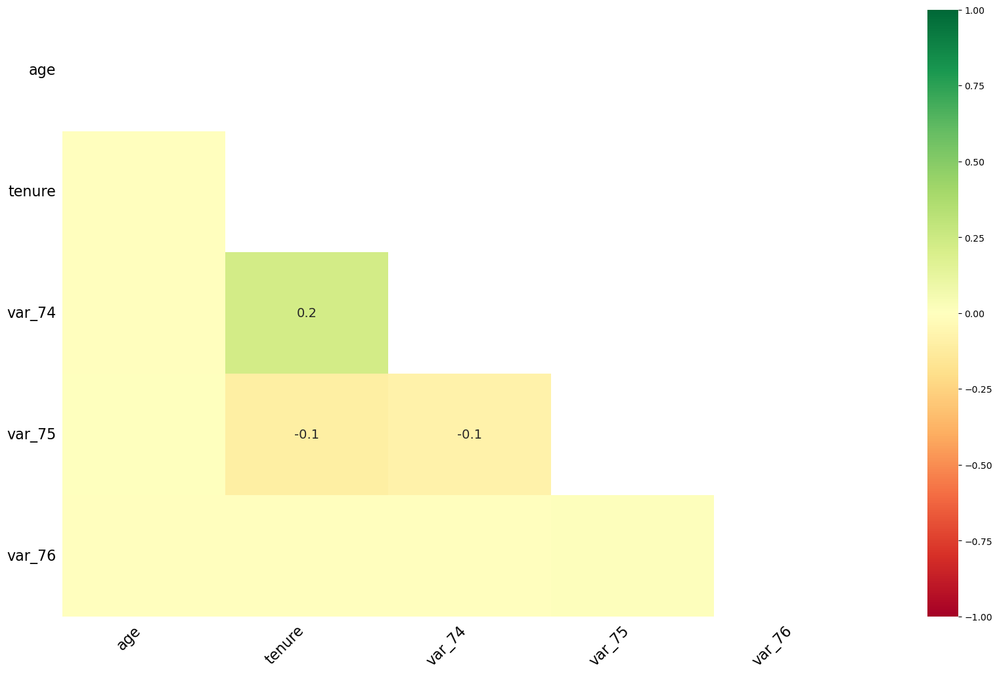

In [39]:
# missingno kitabxanası içərisindən heatmap qrafikini çəkirik.
msn.heatmap(data_numeric,cmap="RdYlGn")

_Bu heatmap Numeric və Null datası olan sütunlar üçün bizə -1 lə 1 arasında bir corelation verir. Bu sütunlar arasındakı corelation 1-ə yaxın dəyərlər olduqda həmin oran qədər dəqiqliklə söyləmək olar ki, çatışmayan dəyərlər həmin sütunlar arasındakı əlaqədən qaynağlanır. Bu qrafik bizə göstərir ki, bizim numeric və çatışmayan dəyərləri olan sütunlarımızdakı çatışmayan dəyərlər, digər çatışmayan dəyərləri olan sütunlardan qaynağlanmır._

In [40]:
#category dəyərlər üçün
null_analyst(data_category)

,Null_Numbers,Null_Numbers_Pr
dev_man,42,0.08
device_os_name,42,0.08
simcard_type,3702,7.01
is_dualsim,1,0.00
is_featurephone,1,0.00
is_smartphone,1,0.00
var_133,3524,6.67


_Bu analizdən məlumdur ki, category sütunlar üçün çatışmayan dəyərlərin faiz göstəricisi çox olmadığından bunları doldurmaq daha  uyğundur_.

_İlk öncə "var_75" sütunu ataq.Bu numeric dəyərlər içərisində 98 faiz Null təşkil edən sütun idi._

In [41]:
data_numeric.drop(columns=["var_75"],axis = 1,inplace=True)

# Çatışmayan dəyərlərin doldurulması

## Numeric sütunlar üçün çatışmayan dəyərlərin doldurulaması

_İlk öncə numeric sütunlar üçün çatışmayan dəyərlərin doldurulmasına baxaq. Bunu etməzdən qabaq sütunların dağılımlarını nəzərdən keçirək.Bunun üçün aşağıdakı kimi bir funksiya yaradaq._

In [42]:
#Bu funksiya həm category həmdə numeric sütunlar üçün histplot çəkdirən funksiyadır.
def hist_plot(data,x,title,category ="linear",color = "target"):
    data_sort = data.sort_values(by=x,ascending = True)
    fig = px.histogram(data_sort, x=x,
                       color=color,opacity=0.4, nbins=50)
    fig.update_xaxes()
    fig.update_layout(
        xaxis_title=x,
        yaxis_title="Count",
        xaxis=dict(showline=True, showgrid=False),
        yaxis=dict(showline=True, showgrid=True),
        font=dict(size=12,color="blue"),title_font=dict(size=20, color='black'),
    )
    fig.update_layout(title_text=f'{title} Histogram',title_x=0.5 )
    fig.update_xaxes(title_font=dict(size=20,color = "black"),type=category)
    fig.update_yaxes(title_font=dict(size=20,color = "black"))
    fig.show()

In [43]:
#Bu funksiya numeric sütunlar üçün boxplot çəkdirir.
def box_plot(data,column,title):
    fig = px.box(data_frame=data, x=column,notched=True)
    fig.update_layout(title_text=title,title_x=0.5,
                      title_font=dict(size=20, color='black'))
    fig.update_xaxes(title_font=dict(size=20,color = "black"))
    fig.show()

## Qrafikləri üzərindən analiz edirik.

### Age sütunu

In [44]:
#hist_plot(dataframe,"age","Age",category = "category")

_Age sütunun outlier dəyərləri atılarsa normal dağılacaığını qrafikdən görmək olur.Bu səbəbdən çatışmayan dəyərləri mean-ilə  doldurmaqdansa medianla doldurmaq daha məqsədə uyğundur._

In [45]:
#box_plot(data_numeric,"age","Age Box")

_Outlier dəyəyrlər box qrafikində açıq şəkildə görünür._

In [46]:
#null doldururuq.
data_numeric["age"].fillna(data_numeric["age"].median(),inplace=True)

### Tenure sütunu

In [47]:
#hist_plot(dataframe,"tenure","Tenure")

In [48]:
#box_plot(data_numeric,"tenure","Tenure boxplot")

_Tenure sütunun dağılımını nəzərdən keçirdikdə normal dağılmadığını görə bilərik.Box plotdan görünür ki Outlier dəyərlərimiz yoxdur.Outlier dəyərlər olmadığı üçün həmçinin Tenure sütununda 10 çatımayan dəyər olduğu üçün bunu mean-lə doldurmağımız problem olmaz_

In [49]:
#null doldururuq.
data_numeric["tenure"].fillna(data_numeric["tenure"].median(),inplace=True)

### Var_74 sütunu

In [50]:
#hist_plot(dataframe,"var_74","Var_74")

In [51]:
#box_plot(data_numeric,"var_74","Var_74 boxplot")

_Var_74 sütunun dağılımını nəzərdən keçirdikdə normal dağılmadığını "positive skewness" olduğunu görə bilirik.
"MOD < MEDIAN < MEAN" olduğunu qrafikə baxıb analiz edirik və biz dataların mod-a ətrafına yığıldığını görürük. Bu səbəbdən çatışmayan dəyərlərimizi mode-ilə doldura bilərik .Bu zaman datanın dağılımında dəyişiklik olmur._

In [52]:
pd.DataFrame(data["var_74"].value_counts()/len(data["var_74"])).head(10)

,var_74
0.00,0.45
0.10,0.14
0.20,0.12
0.30,0.06
0.40,0.04
0.50,0.03
1.20,0.01
0.60,0.01
1.30,0.01
1.40,0.01


_Buradan görürük ki çatımayan dəyərləri ən çox təkrarlanan __0.0__ dəyəri ilə doldura bilərik._

In [53]:
#null doldururuq.
data_numeric["var_74"].fillna(data_numeric["var_74"].mode()[0],inplace=True)

### Var_76 sütunu

In [54]:
#hist_plot(dataframe,"var_76","Var_76")

In [55]:
#box_plot(data_numeric,"var_76","Var_76 boxplot")

_Var_76 sütunun dağılımını nəzərdən keçirdikdə normal dağılmadığını "positive skewness" olduğunu görə bilirik.
"MOD < MEDIAN < MEAN" olduğunu qrafikə baxıb analiz edirik və biz box plotdan outlier dəyərlərin çox olduğunu gördüyümüz üçün  yaxşı olardır ki, çatışmayan dəyərləri __Medianla__ dolduraq._

In [56]:
#null doldururuq.
data_numeric["var_76"].fillna(data_numeric["var_76"].median(),inplace=True)

### Numeric sütunların bütün çatışmayan dəyərlərini hamısına dəyər əlavə etdik.

In [57]:
null_analyst(data_numeric)

,Null_Numbers,Null_Numbers_Pr


## Category sütunlar üçün çatışmayan dəyərlərin doldurulaması

In [58]:
null_analyst(data_category)

,Null_Numbers,Null_Numbers_Pr
dev_man,42,0.08
device_os_name,42,0.08
simcard_type,3702,7.01
is_dualsim,1,0.00
is_featurephone,1,0.00
is_smartphone,1,0.00
var_133,3524,6.67


_Category sütunlardakı çatışmayan dəyərləri doldurmaq üçün sütun üzrə ən çox təkrarlanan dəyərləri əlavə etməklə çatışmayan dəyərləri doldura bilərik.Lakin bunu etməzdən qabaq biz sütunlara weight of evidence metodundan istiadə edə bilərik deyə hələki bu sütunları doldurmuruq.Lakin var_133 və is_dualsim sütununu ən çox təkrarlanan dəyərləri ilə null dəyərlərini dolduracıq.Çünki bu sütunlar numeric olub əslində category olan sütunlardır və biz bunlara weight of evidence metodunu tətbiq etməyəcik._

In [59]:
#var_133 və is_dualsim sütunlarının null datalarının doldurulması
data_category["var_133"].fillna(data_category["var_133"].mode()[0],inplace=True)
data_category["is_dualsim"].fillna(data_category["is_dualsim"].mode()[0],inplace=True)

In [60]:
#cat_null_fill(data_category)

In [61]:
null_analyst(data_category)

,Null_Numbers,Null_Numbers_Pr
dev_man,42,0.08
device_os_name,42,0.08
simcard_type,3702,7.01
is_featurephone,1,0.00
is_smartphone,1,0.00


### Category sütunlar və Numeric sütunlar üçün statistikal göstəricilərinə baxaq.

#### Numeric sütunlar üçün 

In [62]:
data_numeric.describe().T

,count,mean,std,min,25%,50%,75%,max
age,52835.00,45.17,30.40,0.00,35.00,44.00,55.00,1967.00
tenure,52835.00,4041.19,2603.71,1.00,1462.00,4102.00,6433.00,8343.00
var_5,52835.00,635.97,558.16,0.00,204.00,481.00,906.00,2222.00
var_13,52835.00,225.00,314.31,0.00,48.00,120.00,266.00,7280.00
var_14,52835.00,442.92,608.35,0.00,102.00,240.00,522.00,14424.00
var_15,52835.00,668.25,907.85,0.00,160.00,367.00,789.00,21558.00
var_16,52835.00,1374.15,1847.51,0.00,343.00,757.00,1614.00,45937.00
var_17,52835.00,353.32,569.47,0.00,64.40,166.00,397.25,15206.20
var_18,52835.00,700.20,1097.91,0.00,140.15,340.80,785.00,28456.00
var_19,52835.00,1055.26,1622.61,0.00,224.20,523.40,1189.25,45836.20


### Numeric olub əslində category olan sütunlar üçün.

In [63]:
data_category.describe().T

,count,mean,std,min,25%,50%,75%,max
trf,52835.00,4.26,5.06,0.00,1.00,2.00,7.00,21.00
var_8,52835.00,1.15,0.54,0.00,1.00,1.00,1.00,23.00
is_dualsim,52835.00,0.92,0.27,0.00,1.00,1.00,1.00,1.00
is_featurephone,52834.00,0.17,0.38,0.00,0.00,0.00,0.00,1.00
is_smartphone,52834.00,0.83,0.38,0.00,1.00,1.00,1.00,1.00
region,52835.00,16.13,16.77,0.00,7.00,7.00,27.00,58.00
var_81,52835.00,3.01,4.21,0.00,1.00,2.00,4.00,111.00
var_89,52835.00,0.00,0.06,0.00,0.00,0.00,0.00,1.00
var_90,52835.00,0.01,0.11,0.00,0.00,0.00,0.00,2.00
var_91,52835.00,0.01,0.14,0.00,0.00,0.00,0.00,3.00


### Category olan sütunlar üçün.

In [64]:
data_category.select_dtypes(include = "O").describe().T

,count,unique,top,freq
gndr,52835,3,M,40620
dev_man,52793,166,Samsung,26931
device_os_name,52793,8,Android OS,41480
simcard_type,49133,2,4G,33588


## Sütunlar arası corelation analizi

_Ilk öncə sütunların dağılımlarına baxaq.0.95+ və 0.95- corelation olanları müəyyən edək._

In [65]:
#Bu funskiya corelationu 0.95-dən böyük olan sütunları göstərir.
def corelation_analiz(data):
    cor_list=[]
    for col1 in data.select_dtypes(include="number").columns:
        for col2 in data.select_dtypes(include="number").columns:
            cor = data[col1].corr(data[col2])
            if (cor>0.95 or cor<-0.98) and col1!=col2:
                dic = {col1+" "+col2:cor}
                if dic in cor_list:
                    continue
                print(dic)
                cor_list.append(dic)

In [66]:
#Burada category və numeric olan dataframeleri birləşdirib funskiyaya göndərirəm.
data_cat_numeric = data_numeric.join(data_category)

In [67]:
corelation_analiz(data_cat_numeric)

{'var_13 var_14': 0.983707609863526}
{'var_13 var_15': 0.9674601367087551}
{'var_13 var_21': 1.0}
{'var_13 var_22': 0.9837075909886044}
{'var_13 var_23': 0.9674601651954646}
{'var_14 var_13': 0.9837076098635259}
{'var_14 var_15': 0.9910239256188834}
{'var_14 var_16': 0.9636348370217127}
{'var_14 var_21': 0.9837076098635259}
{'var_14 var_22': 0.9999999994596284}
{'var_14 var_23': 0.991023922606415}
{'var_14 var_24': 0.963634846555567}
{'var_15 var_13': 0.9674601367087551}
{'var_15 var_14': 0.9910239256188835}
{'var_15 var_16': 0.9806067434928628}
{'var_15 var_21': 0.9674601367087551}
{'var_15 var_22': 0.9910239160717109}
{'var_15 var_23': 0.9999999993534479}
{'var_15 var_24': 0.9806067415110182}
{'var_16 var_14': 0.9636348370217126}
{'var_16 var_15': 0.9806067434928628}
{'var_16 var_22': 0.9636347954066073}
{'var_16 var_23': 0.9806067127875188}
{'var_16 var_24': 0.9999999993161277}
{'var_17 var_18': 0.9766084264656836}
{'var_17 var_19': 0.9556300951476291}
{'var_18 var_17': 0.9766084264

_Bu analizin nəticəsində görünür ki, bəzi sütunlar arasında corelation 98-100 faizdir.Bu kolumları müəyyən edək və onları datamızdan kənarlaşdıracıq.Çünku bu kolumlar bizim modelimizdə overfiting problemi yarada bilər həmçinin bu sütunlar eyni xüsusiyyeti təmsil edə bilərlər buda modelimizi olduqca qarışdıra bilər._

_Lakin ilk öncə is_featurephone və is_smartphone sütunlarını analiz edək və onların arasındakı 100 də 100 mənfi korelasiyanı araşdıraq.Daha sonra digər 98,99 100 korelasiyası olan sütunlarada baxaq və onlarıda analiz edək._

# Featurephone və Smartphone sütun analizi

In [68]:
data_cat_numeric[["is_featurephone","is_smartphone"]].head(10)

,is_featurephone,is_smartphone
0,0.00,1.00
1,0.00,1.00
2,0.00,1.00
3,0.00,1.00
4,0.00,1.00
5,0.00,1.00
6,0.00,1.00
7,0.00,1.00
8,1.00,0.00
9,0.00,1.00


In [69]:
#Burada onların arasındakı əlaqəni göstərmək üçün lineplot çəkdiririk.
plt.figure(figsize=(6,4))
fig = px.line(data_frame=data_cat_numeric,x = "is_featurephone",y = "is_smartphone");
fig.update_layout(
    xaxis_title="featurephone",
    yaxis_title="smartphone",
    xaxis=dict(showline=True, showgrid=False),
    yaxis=dict(showline=True, showgrid=True),
    font=dict(size=12,color="blue"),title_font=dict(size=20, color='black'),
)
fig.update_layout(title_text='Line Plot',title_x=0.5 )
fig.update_xaxes(title_font=dict(size=20,color = "black"))
fig.update_yaxes(title_font=dict(size=20,color = "black"))
fig.show()

<Figure size 600x400 with 0 Axes>

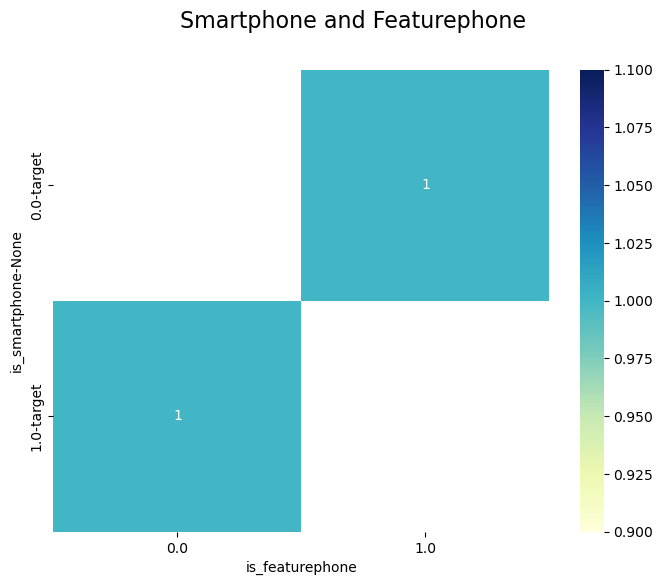

In [70]:
#Burada onların arasındakı əlaqəni göstərmək üçün heatmap çəkdiririk.
#Bunun üçün onların corelation-ları olan pivottable çəkdiririk
pivot_table = data_cat_numeric.pivot_table(index='is_smartphone', columns='is_featurephone',values = "target",aggfunc="corr")
plt.figure(figsize=(8, 6))
sns.heatmap(pivot_table, annot=True, cmap='YlGnBu')
plt.suptitle('Smartphone and Featurephone', fontsize=16)
plt.show()

_Bu corelation heatmap -dən görünür ki, bu iki sütun bir birləri ilə 100-də 100 negativ corelation olduğu üçün əsllində iki data- da eyni məlumatı saxlayır.Bu səbədən bunlardan birini atıb,digərini saxlayacıq._

In [71]:
#iki sütunun daşıdığı məlumatı bir sütunda saxlayırıq.
data_cat_numeric["smartphone_and_featurephone"] = data_cat_numeric["is_smartphone"]

In [72]:
#is_featurephone və is_smartphone sütunlarını atırıq.
data_cat_numeric.drop(columns = ["is_featurephone","is_smartphone"],axis = 1,inplace = True)

In [73]:
#Null dəyər 1 ədəddir
data_cat_numeric["smartphone_and_featurephone"].isnull().sum()

1

In [74]:
#Null dəyərləri mod ilə doldururuq.
mod = data_cat_numeric["smartphone_and_featurephone"].mode()[0]
data_cat_numeric["smartphone_and_featurephone"].fillna(mod,inplace=True)

In [75]:
data_cat_numeric["smartphone_and_featurephone"].isnull().sum()

0

In [76]:
#Bu funskiya corelationu 100  olan sütunlar cütünü bir dictionary-a yığır.
def corelation_analiz_100(data):
    cor_dic={}
    for col1 in data.select_dtypes(include="number").columns:
        for col2 in data.select_dtypes(include="number").columns:
            if col1 == col2:
                continue
            cor = data[col1].corr(data[col2])
            if cor==1:
                cor_dic[col1] = col2
    return cor_dic

In [77]:
cor_1_col = corelation_analiz_100(data_cat_numeric)

_Bu sütunların bir birləri ilə dağılımlarına baxaq._

In [78]:
#corelationu 100 olan sütunlar cütü
cor_1_col

{'var_13': 'var_21',
 'var_21': 'var_13',
 'var_29': 'var_37',
 'var_37': 'var_29',
 'var_45': 'var_53',
 'var_53': 'var_45'}

In [79]:
#corelationu 100 olan sütunlar cütünün dağılımlarına baxaq.
"""fig = make_subplots(rows=3, cols=1) 
i=1
trace = ["var_13 var_21", "var_29 var_37", "var_45 var_53"]

fig = make_subplots(rows=3, cols=1)

i = 0
for col1, col2 in list(cor_1_col.items())[::2]:
    scatter = go.Scatter(x=data_cat_numeric[col1], y=data_cat_numeric[col2], mode='markers', name=trace[i])
    fig.add_trace(scatter, row=i+1, col=1)
    i += 1

fig.update_layout(width=1000, height=900)
fig.update_layout(title_text='Scatter Plotlar', title_x=0.5)
fig.update_xaxes(title_font=dict(size=20, color="black"))
fig.update_yaxes(title_font=dict(size=20, color="black"))
fig.show()"""

'fig = make_subplots(rows=3, cols=1) \ni=1\ntrace = ["var_13 var_21", "var_29 var_37", "var_45 var_53"]\n\nfig = make_subplots(rows=3, cols=1)\n\ni = 0\nfor col1, col2 in list(cor_1_col.items())[::2]:\n    scatter = go.Scatter(x=data_cat_numeric[col1], y=data_cat_numeric[col2], mode=\'markers\', name=trace[i])\n    fig.add_trace(scatter, row=i+1, col=1)\n    i += 1\n\nfig.update_layout(width=1000, height=900)\nfig.update_layout(title_text=\'Scatter Plotlar\', title_x=0.5)\nfig.update_xaxes(title_font=dict(size=20, color="black"))\nfig.update_yaxes(title_font=dict(size=20, color="black"))\nfig.show()'

_Bu plotdan görünür ki bu sütunlar bir-birlərinin birə-bir oxşarlarıdır. Bu səbəbdən bu sütun cütlüklərindən birini atıb digərini isə saxlayacıq._

In [80]:
#eyni məlumatı saxlayan sütunlardan birini atıb digərini saxlayırıq.
data_cat_numeric.drop(columns = ["var_13","var_29","var_45"],axis = 1,inplace = True)

In [81]:
#Bu funskiya corelationu bir neçə sütunla 0.98-dən böyük olan sütunları bir siyahıya yığır.
def corelation_analiz_upper(data):
    cor_list=[]
    for col1 in data.select_dtypes(include="number").columns:
        i=0
        for col2 in data.select_dtypes(include="number").columns:
            cor = data[col1].corr(data[col2])
            if (cor>0.98 or cor<-0.98):
                cor_list.append(col1)
                i+=1
        if i!=1 or i==0:
            pass
        else:
            cor_list.remove(col1)
    return list(set(cor_list))

_Bu funskiya vasitəsi ilə bir neçə sütunla corelationu 98-dən böyük olan sütunları seçirik.Bu sütunları seçdikdən sonra artıq numeric dataframe içərisindən bu sütunlarımızı ata bilərik.Çünki bu sütunlar bir neçə sütunla 98 faiz-dən çox corelation yaradır.Bu sütunları atsaq belə digər sütunar bu sütunların daşıdığı məlumatı açıqlayır.Bu səbəbdən bu sütunları atmağımızda problem yoxdur._

In [82]:
cor_col = corelation_analiz_upper(data_cat_numeric)

In [83]:
#corelationu 98 faizdən böyük olan sütunlar
cor_col

['var_39',
 'var_47',
 'var_14',
 'var_24',
 'var_54',
 'var_55',
 'var_35',
 'var_51',
 'var_122',
 'var_34',
 'var_48',
 'var_46',
 'var_22',
 'var_19',
 'var_23',
 'var_31',
 'var_16',
 'var_97',
 'var_15',
 'var_56',
 'var_38',
 'var_18',
 'var_30',
 'var_32',
 'var_50',
 'var_137',
 'var_208',
 'var_33',
 'var_40',
 'var_37',
 'var_21',
 'var_132']

In [84]:
#corelationu 98 faizdən böyük olan sütunların atılması.
data_cat_numeric.drop(columns = cor_col,axis = 1,inplace = True)

In [85]:
corelation_analiz_upper(data_cat_numeric)

[]

### Catgory sütunların Analizi

In [86]:
data_cat_numeric.select_dtypes(include = "O")

,gndr,dev_man,device_os_name,simcard_type
0,M,Samsung,Android OS,4G
1,M,Samsung,Android OS,NaN
2,M,Samsung,Android OS,4G
3,M,Xiaomi,Android OS,3G
4,M,Samsung,Android OS,4G
...,...,...,...,...
52830,M,Xiaomi,Android OS,4G
52831,M,Samsung,Proprietary,3G
52832,U,Xiaomi,Android OS,4G
52833,M,Samsung,Android OS,3G


# Gender sütunu analizi

In [87]:
#category sütunları üçün barplot funksiyası
def bar_plot(data,x,y,title):
    fig = px.bar(data,x = x,y = y,color=["red","green","yellow"]
    )
    fig.update_layout(
        xaxis_title=x,
        yaxis_title=y,
        xaxis=dict(showline=True, showgrid=False),
        yaxis=dict(showline=True, showgrid=True),
        font=dict(size=12,color="blue"),title_font=dict(size=20, color='black'),
    )
    fig.update_layout(title_text=title,title_x=0.5,
                     font=dict(size=12,color="blue"),title_font=dict(size=20, color='black'))
    fig.update_xaxes(title_font=dict(size=20,color = "black"))
    fig.update_yaxes(title_font=dict(size=20,color = "black"))

    fig.show()
#category sütunları üçün pie funksiyası 
def pie(data,names,values,title):
    fig = px.pie(data, values=values, names=names)
    fig.update_layout(title_text=title,title_x=0.5 )
    fig.show()

In [88]:
gndr_count = data_cat_numeric.gndr.value_counts()
gndr_count = gndr_count.reset_index()
gndr_count.rename({"index":"Gender","gndr":"Counts"},axis=1,inplace=True)
gndr_count

,Gender,Counts
0,M,40620
1,F,7189
2,U,5026


# Müşdərilərin cinsiyyətinə görə paylanması

In [89]:
bar_plot(gndr_count,"Gender","Counts","Gender Counts")

_Qrafikdən görünür ki bizim kişi olan müştərilərimizin sayı qadınlardan və naməlum olanlardan çoxdur._

In [90]:
pie(gndr_count,"Gender","Counts","Gender Counts")

_76.9 faiz müşdərimiz kişi,13.6 faiz müştərilərimiz qadın 9.51 faiz müşdərimizin cinsi isə naməlumdur._

In [91]:
gndr_one_simkart_count = data_cat_numeric.groupby("gndr")["target"].sum()
gndr_one_simkart_count = gndr_one_simkart_count.reset_index()
gndr_one_simkart_count
gndr_one_simkart_count.rename({"gndr":"Gender","target":"One simkart counts"},axis=1,inplace=True)
gndr_one_simkart_count = gndr_one_simkart_count.sort_values(by = "One simkart counts",ascending=False)
gndr_one_simkart_count

,Gender,One simkart counts
1,M,25626
0,F,3677
2,U,3455


# Bir simkart işlədən müşdərilərin cinsiyyətinə görə paylanması

In [92]:
bar_plot(gndr_one_simkart_count,"Gender","One simkart counts","Gender One simkart")

_Bir simkart işlədən müşdərilər işərisində kişi olanların sayı digər cinsdən olan müşdərilərin sayından çoxdur._

In [93]:
pie(gndr_one_simkart_count,"Gender","One simkart counts","Gender One simkart")

_Bir simkart işlədən müşdərilər işərisində 78.2 faizi kişi 11.2 faizi qadın 10.5 faizi isə naməlum cinsiyyətdəndir._

In [94]:
gndr_many_simakrts_counts = data_cat_numeric.groupby("gndr")["target"].agg(["sum","count"])
gndr_many_simakrts_counts["Many simkarts count"] = gndr_many_simakrts_counts["count"]-gndr_many_simakrts_counts["sum"]
gndr_many_simakrts_counts.reset_index(inplace=True)
gndr_many_simakrts_counts.drop(columns=["sum","count"],inplace=True)
gndr_many_simakrts_counts.rename({"gndr":"Gender"},axis=1,inplace=True)
gndr_many_simakrts_counts = gndr_many_simakrts_counts.sort_values(by = "Many simkarts count",ascending=False)

# Bir neçə simkart işlədən müşdərilərin cinsiyyətinə görə paylanması

In [95]:
bar_plot(gndr_many_simakrts_counts,"Gender","Many simkarts count","Gender Many Simkarts")

_Çoxlu simkart işlədən müşdərilər işərisində kişi olanların sayı digər cinsdən olan müşdərilərin sayından çoxdur._

In [96]:
pie(gndr_many_simakrts_counts,"Gender","Many simkarts count","Gender Many Simkarts")

_Bir neçə simkart işlədən müşdərilər işərisində 74.7 faizi kişi 17.5 faizi qadın 7.82 faizi isə naməlum cinsiyyətdəndir._

In [97]:
gndr_target_simkarts = data_cat_numeric.groupby(["target","gndr"]).size()
gndr_target_simkarts = gndr_target_simkarts.reset_index()
gndr_target_simkarts.rename({"target":"Simkarts Type","gndr":"Gender",0:"Count"},inplace=True,axis = 1)
gndr_target_simkarts

,Simkarts Type,Gender,Count
0,0,F,3512
1,0,M,14994
2,0,U,1571
3,1,F,3677
4,1,M,25626
5,1,U,3455


# 1 və ya çox simkart işlədən müşdərilərin cinsiyyətinə görə eyni qrafikdə sayları

In [98]:
fig = px.bar(gndr_target_simkarts, x='Simkarts Type', y='Count', color='Gender')
fig.update_layout(
    xaxis_title="Simkarts Type",
    yaxis_title="Counts",
    xaxis=dict(showline=True, showgrid=False),
    yaxis=dict(showline=True, showgrid=True),
    font=dict(size=12,color="blue"),title_font=dict(size=20, color='black'),
)
fig.update_layout(title_text='Simkarts Type by Gender',title_x=0.5,
                  font=dict(size=12,color="blue"),title_font=dict(size=20, color='black'))
fig.update_xaxes(title_font=dict(size=20,color = "black"))
fig.update_yaxes(title_font=dict(size=20,color = "black"))

fig.show()

# Age sütunun Analizi 

In [99]:
data_cat_numeric.groupby("target")["age"].agg(["mean","median","max","min"])

,mean,median,max,min
target,,,,
0,46.49,45.00,1967.00,1.00
1,44.35,44.00,1967.00,0.00


In [100]:
fig = px.box(data_frame=data_cat_numeric, x="target", y="age",color="gndr",notched=True)
fig.show()

_Bu qrafikdən görünür ki cinsi kişi olanların yaşları daha çox outlier təşkil edir._

In [101]:
fig = px.box(data_frame=data_cat_numeric,y="age",notched=True)
fig.show()

## Age sütunundan Outlierləri təmizləyək.

_Age sütununda Outlierləri təmizləməmişdən qabaq bu Outilierlərə baxaq və bunların nədən qaynağlana biləcəyini müəyyən edək._

In [102]:
Q1 = data_cat_numeric["age"].quantile(0.25)
Q3 = data_cat_numeric["age"].quantile(0.75)
IQR = (Q3-Q1)*1.5
upper = Q3 + IQR
lower = Q1 - IQR
age_outlier = data_cat_numeric[(data_cat_numeric["age"]>upper) | (data_cat_numeric["age"]<lower)]

In [103]:
age_tar = age_outlier.groupby(["gndr","age"])[["target"]].count()
age_tar = age_tar.reset_index()
age_tar

,gndr,age,target
0,F,0.00,1
1,F,86.00,2
2,F,87.00,1
3,M,0.00,1
4,M,1.00,3
5,M,2.00,2
6,M,3.00,3
7,M,86.00,11
8,M,87.00,6
9,M,88.00,2


# Yaşlar içərisindəki Outlier-lərin dağılımı

In [104]:
fig = px.bar(data_frame=age_tar,x = "age",y = "target",color="gndr")

fig.update_xaxes(type='category')
fig.update_layout(
    xaxis_title="Age",
    yaxis_title="Many simkart",
    xaxis=dict(showline=True, showgrid=False),
    yaxis=dict(showline=True, showgrid=True),
    font=dict(size=12,color="blue"),title_font=dict(size=20, color='black'),
)
fig.update_layout(title_text='Age Outlier',title_x=0.5 )
fig.update_xaxes(title_font=dict(size=20,color = "black"))
fig.update_yaxes(title_font=dict(size=20,color = "black"))

fig.show()

_Outlier olan datalara baxdıqda görürük ki bir çox yaş dəyərlərinin təvəllüdlərini yazdığı məlum olur.Bu dəyərləri bu günkü tarixdən çıxaraq əvəzləyə bilərik._ 

### Yaşlarının yerinə doğum tarixlərini yazan şəxslərin yaşlarını düzənləyək.

In [105]:
year = date.today().year

In [106]:
data_cat_numeric["age"]=data_cat_numeric["age"].apply(lambda x:year-x if x>1900 else x)

In [107]:
data_cat_numeric[data_cat_numeric["age"]>1900]

,age,tenure,var_5,var_17,var_20,var_25,var_26,var_27,var_28,var_36,var_41,var_42,var_43,var_44,var_49,var_52,var_53,var_57,var_58,var_59,var_60,var_61,var_62,var_63,var_64,var_65,var_66,var_67,var_68,var_69,var_70,var_71,var_72,var_74,var_76,var_77,var_78,var_79,var_80,var_82,var_83,var_84,var_85,var_86,var_87,var_88,var_98,var_99,var_100,var_101,var_102,var_103,var_105,var_106,var_107,var_109,var_110,var_111,var_113,var_114,var_115,var_117,var_118,var_119,var_120,var_121,var_123,var_124,var_129,var_135,var_138,var_140,var_142,var_143,var_144,var_145,var_146,var_147,var_148,var_149,var_150,var_151,var_152,var_153,var_154,var_155,var_157,var_158,var_159,var_160,var_161,var_162,var_164,var_165,var_166,var_167,var_168,var_169,var_170,var_171,var_172,var_173,var_174,var_175,var_176,var_177,var_179,var_180,var_181,var_182,var_183,var_184,var_186,var_187,var_188,var_189,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199,var_202,var_204,var_205,var_206,var_207,var_209,var_210,gndr,dev_man,device_os_name,simcard_type,trf,var_8,is_dualsim,region,var_81,var_89,var_90,var_91,var_92,var_93,var_94,var_95,var_96,var_104,var_108,var_112,var_116,var_125,var_126,var_127,var_128,var_130,var_131,var_133,var_134,var_136,var_139,var_141,var_156,var_163,var_178,var_185,var_200,target,var_203,is_bundle_trf,smartphone_and_featurephone


_Yaşları 18 den kicik olanlar ve yaxud 100-den boyuk olanlar böyük ehtimalla yaş hissəsini mənasız məlumatlar yazıblar.Bunu İQR vasitesti ile doldurmaq yaxşı olmaz. Bunun üçün KNNImputer-dən istifadə edəcəyik.KNN imputer null dataları doldurmaq üçün istifadə olunur.Biz outiler datalarımıza Null dəyərlər mənimsədib daha sonra KNNimputer vasitəsi ilə dolduracıq._

## Outlierlərin təmizlənməsi

In [108]:
data_numeric["age"] = data_numeric["age"].apply(lambda x : np.nan if x<18 else np.nan if x>100 else x)

In [109]:
imputer = KNNImputer(n_neighbors=10)
imputed_data = imputer.fit_transform(data_numeric)
imputed_data = pd.DataFrame(imputed_data, columns=data_numeric.columns)

In [110]:
data_cat_numeric["age"] = imputed_data["age"]

In [111]:
#yaş sütunun dağılımı target sütununa görə.
hist_plot(data_cat_numeric,"age","Age")

In [112]:
#yaş sütunun dağılımına boxplot diagramına görə baxaq.
def box_plot(data,column,title):
    fig = px.box(data_frame=data, y=column,notched=True)
    fig.update_layout(title_text=title,title_x=0.5,
                      title_font=dict(size=20, color='black'))
    fig.update_xaxes(title_font=dict(size=20,color = "black"))
    fig.show()

In [113]:
box_plot(data_cat_numeric,"age","Age box")

_Burada box qrafikindən görünür ki age sütununu 100-dən yuxarı dəyərləri və 18-dən aşağı dəyərləri KNNimputer vasitəsi ilə dolduruldu.Ama yeneədə bizdə Age sütununda Outlier dəyərlər qaldığı boxplotdan görünür.Bunları əvəzləmək üçün isə İQR-metodundan istifadə edəcik._

In [114]:
#age sütunundakı outlier dəyərləri əvəzləyək.
def outlier_clean(data,column):
    Q1 = data[column].quantile(0.25)
    Q3 = data[column].quantile(0.75)
    IQR = (Q3 - Q1)*1.5
    upper = Q3 + IQR
    lower = Q1-IQR
    data[column] = data[column].apply(lambda x :upper if x>upper else lower if x<lower else x)

In [115]:
outlier_clean(data_cat_numeric,"age")

In [116]:
#yaş sütunun dağılımına boxplot diagramına görə baxaq.
box_plot(data_cat_numeric,"age","Age box")

_Outlier dəyərlər ümumi age dağılımında əvəz olundu._

In [117]:
#yaş sütunun dağılımına boxplot diagramında cinsiyyət fərqlərinə görə baxaq.
fig = px.box(data_frame=data_cat_numeric, x="target", y="age",color="gndr",notched=True)
fig.show()

_Buradan görünür ki birdən çox simkart işlədən  kişilərin öz aralarındakı dağılımda outlier dəyərlər var._

In [118]:
data_cat_numeric.groupby("target")["age"].agg(["mean","median","max","min"])

,mean,median,max,min
target,,,,
0,45.91,45.00,85.00,18.00
1,44.09,44.00,85.00,18.00


In [119]:
#yaş sütunun dağılımı target sütununa görə outlier dəyərlər təmizlənmiş halı.
hist_plot(data_cat_numeric,"age","Age")

# Age sütununu normallaşdırmaq üçün bütün dəyərləri 100 bölməklə normallaşdıra bilərik.

In [120]:
data_cat_numeric["age"] = data_cat_numeric["age"]/100

In [121]:
data_cat_numeric.groupby("target")["age"].agg(["mean","median","max","min"])

,mean,median,max,min
target,,,,
0,0.46,0.45,0.85,0.18
1,0.44,0.44,0.85,0.18


In [122]:
#yaş sütunun dağılımına boxplot diagramına görə baxaq.
hist_plot(data_cat_numeric,"age","Age")

In [123]:
data_cat_numeric.head()

,age,tenure,var_5,var_17,var_20,var_25,var_26,var_27,var_28,var_36,var_41,var_42,var_43,var_44,var_49,var_52,var_53,var_57,var_58,var_59,var_60,var_61,var_62,var_63,var_64,var_65,var_66,var_67,var_68,var_69,var_70,var_71,var_72,var_74,var_76,var_77,var_78,var_79,var_80,var_82,var_83,var_84,var_85,var_86,var_87,var_88,var_98,var_99,var_100,var_101,var_102,var_103,var_105,var_106,var_107,var_109,var_110,var_111,var_113,var_114,var_115,var_117,var_118,var_119,var_120,var_121,var_123,var_124,var_129,var_135,var_138,var_140,var_142,var_143,var_144,var_145,var_146,var_147,var_148,var_149,var_150,var_151,var_152,var_153,var_154,var_155,var_157,var_158,var_159,var_160,var_161,var_162,var_164,var_165,var_166,var_167,var_168,var_169,var_170,var_171,var_172,var_173,var_174,var_175,var_176,var_177,var_179,var_180,var_181,var_182,var_183,var_184,var_186,var_187,var_188,var_189,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199,var_202,var_204,var_205,var_206,var_207,var_209,var_210,gndr,dev_man,device_os_name,simcard_type,trf,var_8,is_dualsim,region,var_81,var_89,var_90,var_91,var_92,var_93,var_94,var_95,var_96,var_104,var_108,var_112,var_116,var_125,var_126,var_127,var_128,var_130,var_131,var_133,var_134,var_136,var_139,var_141,var_156,var_163,var_178,var_185,var_200,target,var_203,is_bundle_trf,smartphone_and_featurephone
0,0.64,6384.00,1507,276.20,1892.60,0.90,1.00,0.90,0.90,913.00,1.10,1.10,0.90,1.00,4.50,22.20,1.00,1.10,0.90,0.80,0.90,40.00,93.00,152.00,272.00,396.36,710.90,831.14,1014.69,11.33,25.36,35.68,62.64,0.00,5.20,12.00,27.00,36.00,57.00,9.00,12.00,19.00,0.00,0.00,0.00,0.00,0,0,0,396,3,0,0,0,0,0,0,0,0,89,0,0,18,58,42,0,7.62,0.14,0,0.00,0.00,0.00,0.00,64,0.00,3,0.00,0.29,6.88,0.05,0.24,0.00,0.00,0.00,0.00,0.00,3.00,0.00,0,0.55,1,0.00,0.00,190,4.80,12,0.00,0.78,24.39,0.10,0.68,0.04,0.00,0.00,0.22,0.00,9.00,0.00,0,2.20,4,0.00,0.00,383,41.40,17,0.00,1.52,44.16,0.15,1.34,0.04,0.00,0.00,0.22,0.00,0,3.00,9.00,0,0,0,0,M,Samsung,Android OS,4G,2,1,1.00,1,4.00,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.00,3.00,0.00,0,0,0.00,0,0.00,0,0.00,0,0,0,1.00
1,0.35,6180.00,565,668.90,4185.60,1.40,1.30,1.40,1.40,2132.20,1.20,1.20,1.30,1.30,21.50,193.50,4.75,1.10,1.10,1.30,1.20,34.00,70.00,116.00,242.00,53.85,2247.46,4182.41,9356.48,10.01,30.00,51.98,97.54,0.00,12.20,10.00,20.00,50.00,95.00,2.00,4.00,9.00,0.00,0.00,0.00,0.00,0,0,0,0,53,53,0,0,0,0,0,42,0,0,0,0,0,0,0,0,0.75,0.05,0,0.00,0.00,0.00,0.00,8,0.00,0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0,8.80,9,10.00,0.00,54,8.70,1,0.00,0.00,0.78,0.00,0.00,0.14,0.00,0.00,0.00,0.00,0.00,0.00,0,10.23,14,11.00,0.00,126,15.30,3,0.00,0.12,3.84,0.06,0.00,3.09,0.10,0.00,0.00,0.00,0,0.00,0.00,0,0,2,0,M,Samsung,Android OS,NaN,16,1,1.00,0,1.00,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.00,0.00,0.00,0,0,0.00,0,0.00,0,0.00,0,0,1,1.00
2,0.26,1534.00,1078,4.50,352.20,0.60,2.70,3.00,3.00,7.40,0.00,0.00,0.50,0.90,0.50,6.20,0.25,0.50,0.50,0.70,0.70,63.00,82.00,133.00,242.00,1913.52,2041.40,2849.79,3227.02,5.17,6.22,10.73,14.03,2.60,32.50,0.00,4.00,8.00,12.00,2.00,4.00,7.00,0.00,0.00,0.00,0.00,0,0,0,0,209,0,1913,0,39,0,92,0,0,42,0,1,0,43,1380,0,0.06,0.08,130,0.00,0.00,0.00,0.00,9,2.00,1,0.00,0.06,0.00,0.00,0.00,0.01,0.00,0.00,0.00,0.00,5.00,6.00,4,0.00,0,0.00,3.70,40,15.80,7,0.00,0.66,0.08,0.60,0.00,0.07,0.00,0.00,1.11,0.00,6.50,8.00,5,0.00,0,0.00,11.00,103,42.50,53,0.00,0.66,0.48,0.60,0.00,0.07,0.00,0.05,1.11,0.00,0,5.00,8.39,0,0,0,1,M,Samsung,Android OS,4G,0,1,1.00,1,0.00,0,0,0,0,0,0,0,0,0,2,0,0,0,0,0,0,1,21,0.00,0.00,4.00,0,0,0.00,3,0.00,6,0.00,1,0,0,1.00
3,0.36,3925.00,1219,1692.90,9425.80,1.60,1.70,1.70,1.50,5485.20,1.60,1.70,1.70,1.50,40.80,178.10,9.50,1.10,1.20,1.10,1.00,122.00,312.00,455.00,958.00,0.00,0.00,0.00,0.00,15.52,29.70,43.17,88.51,0.20,4.60,9.00,28.00,41.00,91.00,8.00,11.00,26.00,0.00,0.00,0.00,0.00,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1.21,2.03,0,0.00,0.22,3.50,0.00,71,77.30,18,0.00,2.73,1.03,1.11,0.96,0.00,0.00,0.05,0.00,0.00,0.00,1.00,1,2.64,9,4.00,0.00,256,168

# dev_man sütun analizi

In [124]:
dev_man_tar = data_cat_numeric.groupby("dev_man")[["target"]].count().reset_index()
dev_man_tar = dev_man_tar.sort_values(by = "target",ascending=False)

_Telefon şirkətlərinə görə müşdərilərimizin sayına baxaq._

In [125]:
dev_man_tar = dev_man_tar[dev_man_tar["target"]>10]
dev_man_tar

,dev_man,target
111,Samsung,26931
159,Xiaomi,12912
88,Nokia,2583
47,Hmd Global Oy,2334
6,Apple,2303
55,Huawei,2023
44,Hedy,416
82,Microsoft Mobile,387
68,LG,304
147,Ut Group Limited,239


In [126]:
fig = px.bar(data_frame=dev_man_tar,x = "dev_man",y = "target",color="dev_man")

fig.update_xaxes(type='category')
fig.update_layout(
    xaxis_title="dev_man",
    yaxis_title="Countst",
    xaxis=dict(showline=True, showgrid=False),
    yaxis=dict(showline=True, showgrid=True),
    font=dict(size=12,color="blue"),title_font=dict(size=20, color='black'),
)
fig.update_layout(title_text='Dev_man',title_x=0.5 )
fig.update_xaxes(title_font=dict(size=20,color = "black"))
fig.update_yaxes(title_font=dict(size=20,color = "black"))

fig.show()

_Buradakı qrafikden görünür ki, şəxslərin istifadə etdikləri teflon şirkətləri həddindən artıq çoxdur.Bu şirkətləri One Hot Encoding edə bilərik. Lakin bu zaman sütun sayı həddindən artıq çox olmuş olacaq. Və bizdə ağac modelləri qursaq bu zaman ağacın dərinliyi artmış olacaq və bu overfittingə gətirib çıxaracaq.Bunun üçün yaxşı olardır ki hər bir şirkəti WOE dəyərləri ilə əvəz edək._

In [127]:
woe_dev_man = data_cat_numeric.groupby("dev_man")["target"].mean()
woe_dev_man = pd.DataFrame(woe_dev_man).reset_index()
woe_dev_man['good'] = woe_dev_man['target']
woe_dev_man['bad'] = 1 - woe_dev_man['good']
woe_dev_man['bad'] = np.where(woe_dev_man['bad'] == 0, 0.00001, woe_dev_man['bad'])
woe_dev_man['WOE'] = np.log(woe_dev_man['good'] / woe_dev_man['bad'])
data_cat_numeric['dev_man_woe'] = data_cat_numeric['dev_man'].map(woe_dev_man.set_index('dev_man')['WOE'])

In [128]:
data_cat_numeric.drop(columns="dev_man",axis = 1,inplace = True)

In [129]:
data_cat_numeric.corr()["target"].loc["dev_man_woe"]

0.11707389414335852

In [130]:
data_cat_numeric[data_cat_numeric["dev_man_woe"].isnull()]["dev_man_woe"]

203     NaN
2626    NaN
2837    NaN
2979    NaN
2980    NaN
2981    NaN
3610    NaN
3854    NaN
5697    NaN
8967    NaN
12745   NaN
17403   NaN
17827   NaN
18178   NaN
18525   NaN
18839   NaN
19545   NaN
22274   NaN
23208   NaN
25464   NaN
26461   NaN
27309   NaN
27425   NaN
27616   NaN
30508   NaN
31637   NaN
31640   NaN
32087   NaN
32236   NaN
33656   NaN
35883   NaN
36006   NaN
36026   NaN
37657   NaN
42598   NaN
44716   NaN
45692   NaN
45894   NaN
47370   NaN
48695   NaN
49838   NaN
50050   NaN
Name: dev_man_woe, dtype: float64

_Woe dəyərlərini hesablatdıqdan sonra burada bəzi dəyərlər Nan olaraq gəldi.Bunların sonsuz dəyərlərlə dolu olduğu anlamına gələ bilər._

_Bunun qarşısını almaq üçün WOE sütunun dağılımına baxaq və həmin dəyərləri nə ilə əvəz edə bilərik onu analiz edək._

In [131]:
hist_plot(data_cat_numeric,"dev_man_woe","dev_man_woe")

_Buradakı dəyərləri əvəzləmək üçün üçün ən yaxşısı mod ilə əvəzləməkdir._

In [132]:
mod = data_cat_numeric["dev_man_woe"].mode()[0]

In [133]:
data_cat_numeric["dev_man_woe"] = data_cat_numeric["dev_man_woe"].apply(lambda x : mod if np.isinf(x) 
                                                                        else mod if np.isnan(x) else x)

In [134]:
data_cat_numeric["dev_man_woe"].isnull().sum()

0

_Buradan görünür ki bu sütunlar arasında woe dəyərləri ile əvəz etməyimiz problem yaratmır._

# device_os_name sütunu analizi

In [135]:
data_dev_os = pd.DataFrame(data_cat_numeric["device_os_name"].value_counts()).reset_index()

In [136]:
fig = px.bar(data_frame=data_dev_os,x = "index",y = "device_os_name",color="index")

fig.update_xaxes(type='category')
fig.update_layout(
    xaxis_title="dev_man",
    yaxis_title="Countst",
    xaxis=dict(showline=True, showgrid=False),
    yaxis=dict(showline=True, showgrid=True),
    font=dict(size=12,color="blue"),title_font=dict(size=20, color='black'),
)
fig.update_layout(title_text='OS histogram',title_x=0.5 )
fig.update_xaxes(title_font=dict(size=20,color = "black"))
fig.update_yaxes(title_font=dict(size=20,color = "black"))

fig.show()

In [137]:
pie(data_dev_os,"index","device_os_name","OS")

_Buradan görünür ki ən çox müşdərilərimizin telfonlarının Əməliyyat Sistemi Android əməliyyat sistemidir 78.6 faizlə. Buradakı qrafikden görünür ki, şəxslərin istifadə etdikləri teflonların Əməliyyat sistemlərinin müxtəlifliyi çox deyil. Bu şirkətləri One Hot Encoding edə bilərik._

In [138]:
data_cat_numeric["device_os_name"].isnull().sum()

42

_Null dəyərləri doldurmaq üçün ən çox təkrarlanan dəyərlərlə doldura bilərik._

In [139]:
data_cat_numeric["device_os_name"].fillna(data_cat_numeric["device_os_name"].mode()[0],inplace=True)

In [140]:
data_cat_numeric["device_os_name"].isnull().sum()

0

_Bu sütunu One Hot encoding edərək category dəyişənləri numeric dəyişənlərə çevirək._

In [141]:
data_cat_numeric = pd.get_dummies(data_cat_numeric,columns =["device_os_name"],drop_first=True)

# simcard_type sütunun analizi

In [142]:
data_cat_numeric["simcard_type"].isnull().sum()

3702

In [143]:
data_cat_numeric["simcard_type"].value_counts()

4G    33588
3G    15545
Name: simcard_type, dtype: int64

_Buardakı Null dəyərləri ən çox təkrarlanan dəyərlə dolduracıq.Bunun üçün mode-dən istifadə edəcik. Çünki bu sütun iki dəyərədn ibarətdir və numeric olub əslində category olan sütundur._

In [144]:
data_cat_numeric["simcard_type"].fillna(data_cat_numeric["simcard_type"].mode()[0],inplace=True)

In [145]:
data_simcard_type = data_cat_numeric.groupby(["simcard_type","target"]).size()
data_simcard_type = data_simcard_type.reset_index()
data_simcard_type = data_simcard_type.rename({0:"Counts"},axis=1)

In [146]:
data_simcard_type

,simcard_type,target,Counts
0,3G,0,7225
1,3G,1,8320
2,4G,0,12852
3,4G,1,24438


In [147]:
#Simkarts Type və Target sütununa görə müşdərilərin sayına və hansi tip abunəikləri var ona baxa bilərik.
fig = px.bar(data_frame=data_simcard_type,x = "simcard_type",y = "Counts",color="target")

fig.update_xaxes(type='category')
fig.update_layout(
    xaxis_title="Simkart Type",
    yaxis_title="Counts",
    xaxis=dict(showline=True, showgrid=False),
    yaxis=dict(showline=True, showgrid=True),
    font=dict(size=12,color="blue"),title_font=dict(size=20, color='black'),
)
fig.update_layout(title_text='Simkarts Type and Target',title_x=0.5 )
fig.update_xaxes(title_font=dict(size=20,color = "black"))
fig.update_yaxes(title_font=dict(size=20,color = "black"))

fig.show()

_Buradan görünür ki bizim müşdərilərimiz daha çox 4G tip simkartları var. Həmçinin 4G simkart işlədən şəxslərin öz aralırında birneçə simkart abunəlikləri olanların sayı bir abunəlikləri olanların sayından çoxdur.3G tip simkart istifadə edən şəxlərdə isə bu balans normaldır._

_Bu kolumu LabelEncoder istifadə edərək category dəyərlərdən numeric dəyərlərə çevirə bilərik._

In [148]:
le = LabelEncoder()
data_cat_numeric["simcard_type"] = le.fit_transform(data_cat_numeric["simcard_type"])

In [149]:
data_cat_numeric["simcard_type"][:10]

0    1
1    1
2    1
3    0
4    1
5    1
6    1
7    1
8    0
9    1
Name: simcard_type, dtype: int32

In [150]:
le = LabelEncoder()
data_cat_numeric["simcard_type"] = le.fit_transform(data_cat_numeric["simcard_type"])

_Bütün analizlerimiz bitdiyi üçün gender sütununuda Onehotencoding edərək category olan sütunu numeric dəyərlərə çevirək._

In [151]:
data_cat_numeric = pd.get_dummies(data_cat_numeric,columns =["gndr"],drop_first=True)

In [152]:
data_cat_numeric.head()

,age,tenure,var_5,var_17,var_20,var_25,var_26,var_27,var_28,var_36,var_41,var_42,var_43,var_44,var_49,var_52,var_53,var_57,var_58,var_59,var_60,var_61,var_62,var_63,var_64,var_65,var_66,var_67,var_68,var_69,var_70,var_71,var_72,var_74,var_76,var_77,var_78,var_79,var_80,var_82,var_83,var_84,var_85,var_86,var_87,var_88,var_98,var_99,var_100,var_101,var_102,var_103,var_105,var_106,var_107,var_109,var_110,var_111,var_113,var_114,var_115,var_117,var_118,var_119,var_120,var_121,var_123,var_124,var_129,var_135,var_138,var_140,var_142,var_143,var_144,var_145,var_146,var_147,var_148,var_149,var_150,var_151,var_152,var_153,var_154,var_155,var_157,var_158,var_159,var_160,var_161,var_162,var_164,var_165,var_166,var_167,var_168,var_169,var_170,var_171,var_172,var_173,var_174,var_175,var_176,var_177,var_179,var_180,var_181,var_182,var_183,var_184,var_186,var_187,var_188,var_189,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199,var_202,var_204,var_205,var_206,var_207,var_209,var_210,simcard_type,trf,var_8,is_dualsim,region,var_81,var_89,var_90,var_91,var_92,var_93,var_94,var_95,var_96,var_104,var_108,var_112,var_116,var_125,var_126,var_127,var_128,var_130,var_131,var_133,var_134,var_136,var_139,var_141,var_156,var_163,var_178,var_185,var_200,target,var_203,is_bundle_trf,smartphone_and_featurephone,dev_man_woe,device_os_name_Bada OS,device_os_name_BlackBerry OS,device_os_name_KaiOS,device_os_name_Microsoft Windows,device_os_name_Proprietary,device_os_name_Symbian OS,device_os_name_iOS,gndr_M,gndr_U
0,0.64,6384.00,1507,276.20,1892.60,0.90,1.00,0.90,0.90,913.00,1.10,1.10,0.90,1.00,4.50,22.20,1.00,1.10,0.90,0.80,0.90,40.00,93.00,152.00,272.00,396.36,710.90,831.14,1014.69,11.33,25.36,35.68,62.64,0.00,5.20,12.00,27.00,36.00,57.00,9.00,12.00,19.00,0.00,0.00,0.00,0.00,0,0,0,396,3,0,0,0,0,0,0,0,0,89,0,0,18,58,42,0,7.62,0.14,0,0.00,0.00,0.00,0.00,64,0.00,3,0.00,0.29,6.88,0.05,0.24,0.00,0.00,0.00,0.00,0.00,3.00,0.00,0,0.55,1,0.00,0.00,190,4.80,12,0.00,0.78,24.39,0.10,0.68,0.04,0.00,0.00,0.22,0.00,9.00,0.00,0,2.20,4,0.00,0.00,383,41.40,17,0.00,1.52,44.16,0.15,1.34,0.04,0.00,0.00,0.22,0.00,0,3.00,9.00,0,0,0,0,1,2,1,1.00,1,4.00,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.00,3.00,0.00,0,0,0.00,0,0.00,0,0.00,0,0,0,1.00,0.54,0,0,0,0,0,0,0,1,0
1,0.35,6180.00,565,668.90,4185.60,1.40,1.30,1.40,1.40,2132.20,1.20,1.20,1.30,1.30,21.50,193.50,4.75,1.10,1.10,1.30,1.20,34.00,70.00,116.00,242.00,53.85,2247.46,4182.41,9356.48,10.01,30.00,51.98,97.54,0.00,12.20,10.00,20.00,50.00,95.00,2.00,4.00,9.00,0.00,0.00,0.00,0.00,0,0,0,0,53,53,0,0,0,0,0,42,0,0,0,0,0,0,0,0,0.75,0.05,0,0.00,0.00,0.00,0.00,8,0.00,0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0,8.80,9,10.00,0.00,54,8.70,1,0.00,0.00,0.78,0.00,0.00,0.14,0.00,0.00,0.00,0.00,0.00,0.00,0,10.23,14,11.00,0.00,126,15.30,3,0.00,0.12,3.84,0.06,0.00,3.09,0.10,0.00,0.00,0.00,0,0.00,0.00,0,0,2,0,1,16,1,1.00,0,1.00,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.00,0.00,0.00,0,0,0.00,0,0.00,0,0.00,0,0,1,1.00,0.54,0,0,0,0,0,0,0,1,0
2,0.26,1534.00,1078,4.50,352.20,0.60,2.70,3.00,3.00,7.40,0.00,0.00,0.50,0.90,0.50,6.20,0.25,0.50,0.50,0.70,0.70,63.00,82.00,133.00,242.00,1913.52,2041.40,2849.79,3227.02,5.17,6.22,10.73,14.03,2.60,32.50,0.00,4.00,8.00,12.00,2.00,4.00,7.00,0.00,0.00,0.00,0.00,0,0,0,0,209,0,1913,0,39,0,92,0,0,42,0,1,0,43,1380,0,0.06,0.08,130,0.00,0.00,0.00,0.00,9,2.00,1,0.00,0.06,0.00,0.00,0.00,0.01,0.00,0.00,0.00,0.00,5.00,6.00,4,0.00,0,0.00,3.70,40,15.80,7,0.00,0.66,0.08,0.60,0.00,0.07,0.00,0.00,1.11,0.00,6.50,8.00,5,0.00,0,0.00,11.00,103,42.50,53,0.00,0.66,0.48,0.60,0.00,0.07,0.00,0.05,1.11,0.00,0,5.00,8.39,0,0,0,1,1,0,1,1.00,1,0.00,0,0,0,0,0,0,0,0,0,2,0,0,0,0,0,0,1,21,0.00,0.00,4.00,0,0,0.00,3,0.00,6,0.00,1,0,0,1.00,0.54,0,0,0,0,0,0,0,1,0
3,0.36,3925.00,1219,1692.90,9425.80,1.60,1.70,1.70,1.50,5485.20,1.60,1.70,1.70,1.50,40.80,178.10,9.50,1.10,1.20,1.10,1.00,122.00,312.00,455.00,958.00,0.00,0.00,0.00,0.00,15.52,29.70,43.17,88.51,0.20,4.60,9.00,28.00,41.00,91.00,8.00,11.00,26.00,0.00,0.00,0.

# Region sütun analizi

In [153]:
data_region = data_cat_numeric.groupby(["region","target"]).size()
data_region = data_region.reset_index()
data_region = data_region.rename({0:"Counts"},axis=1)

In [154]:
data_region

,region,target,Counts
0,0,0,3278
1,0,1,7402
2,1,0,356
3,1,1,163
4,2,0,240
5,2,1,117
6,3,0,228
7,3,1,178
8,4,0,108
9,4,1,138


In [155]:
fig = px.bar(data_frame=data_region,x = "region",y = "Counts",color="target")

fig.update_xaxes(type='category')
fig.update_layout(
    xaxis_title="Region",
    yaxis_title="Counts",
    xaxis=dict(showline=True, showgrid=False),
    yaxis=dict(showline=True, showgrid=True),
    font=dict(size=12,color="blue"),title_font=dict(size=20, color='black'),
)
fig.update_layout(title_text='Region  and Target',title_x=0.5 )
fig.update_xaxes(title_font=dict(size=20,color = "black"))
fig.update_yaxes(title_font=dict(size=20,color = "black"))

fig.show()

_Region sütunu type olaraq numeric olsada  əslində category bir sütundur. Bu səbədən ona category kimi yanaşmaq lazimdir.Bu region sütununu atmaqdan sa WOE dəyərlərini almaq və onları region sütununda əvəz etmək model üçün faydalı ola bilər._

In [156]:
woe_region= data_cat_numeric.groupby("region")["target"].mean()
woe_region = pd.DataFrame(woe_region).reset_index()
woe_region['good'] = woe_region['target']
woe_region['bad'] = 1 - woe_region['good']
woe_region['bad'] = np.where(woe_region['bad'] == 0, 0.00001, woe_region['bad'])
woe_region['WOE'] = np.log(woe_region['good'] / woe_region['bad'])
data_cat_numeric['region_woe'] = data_cat_numeric['region'].map(woe_region.set_index('region')['WOE'])

In [157]:
data_cat_numeric.corr()["target"].loc[["region","region_woe"]]

region       -0.07
region_woe    0.22
Name: target, dtype: float64

In [158]:
data_cat_numeric.drop(columns = "region",axis = 1,inplace = True)

In [159]:
data_cat_numeric.head()

,age,tenure,var_5,var_17,var_20,var_25,var_26,var_27,var_28,var_36,var_41,var_42,var_43,var_44,var_49,var_52,var_53,var_57,var_58,var_59,var_60,var_61,var_62,var_63,var_64,var_65,var_66,var_67,var_68,var_69,var_70,var_71,var_72,var_74,var_76,var_77,var_78,var_79,var_80,var_82,var_83,var_84,var_85,var_86,var_87,var_88,var_98,var_99,var_100,var_101,var_102,var_103,var_105,var_106,var_107,var_109,var_110,var_111,var_113,var_114,var_115,var_117,var_118,var_119,var_120,var_121,var_123,var_124,var_129,var_135,var_138,var_140,var_142,var_143,var_144,var_145,var_146,var_147,var_148,var_149,var_150,var_151,var_152,var_153,var_154,var_155,var_157,var_158,var_159,var_160,var_161,var_162,var_164,var_165,var_166,var_167,var_168,var_169,var_170,var_171,var_172,var_173,var_174,var_175,var_176,var_177,var_179,var_180,var_181,var_182,var_183,var_184,var_186,var_187,var_188,var_189,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199,var_202,var_204,var_205,var_206,var_207,var_209,var_210,simcard_type,trf,var_8,is_dualsim,var_81,var_89,var_90,var_91,var_92,var_93,var_94,var_95,var_96,var_104,var_108,var_112,var_116,var_125,var_126,var_127,var_128,var_130,var_131,var_133,var_134,var_136,var_139,var_141,var_156,var_163,var_178,var_185,var_200,target,var_203,is_bundle_trf,smartphone_and_featurephone,dev_man_woe,device_os_name_Bada OS,device_os_name_BlackBerry OS,device_os_name_KaiOS,device_os_name_Microsoft Windows,device_os_name_Proprietary,device_os_name_Symbian OS,device_os_name_iOS,gndr_M,gndr_U,region_woe
0,0.64,6384.00,1507,276.20,1892.60,0.90,1.00,0.90,0.90,913.00,1.10,1.10,0.90,1.00,4.50,22.20,1.00,1.10,0.90,0.80,0.90,40.00,93.00,152.00,272.00,396.36,710.90,831.14,1014.69,11.33,25.36,35.68,62.64,0.00,5.20,12.00,27.00,36.00,57.00,9.00,12.00,19.00,0.00,0.00,0.00,0.00,0,0,0,396,3,0,0,0,0,0,0,0,0,89,0,0,18,58,42,0,7.62,0.14,0,0.00,0.00,0.00,0.00,64,0.00,3,0.00,0.29,6.88,0.05,0.24,0.00,0.00,0.00,0.00,0.00,3.00,0.00,0,0.55,1,0.00,0.00,190,4.80,12,0.00,0.78,24.39,0.10,0.68,0.04,0.00,0.00,0.22,0.00,9.00,0.00,0,2.20,4,0.00,0.00,383,41.40,17,0.00,1.52,44.16,0.15,1.34,0.04,0.00,0.00,0.22,0.00,0,3.00,9.00,0,0,0,0,1,2,1,1.00,4.00,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.00,3.00,0.00,0,0,0.00,0,0.00,0,0.00,0,0,0,1.00,0.54,0,0,0,0,0,0,0,1,0,-0.78
1,0.35,6180.00,565,668.90,4185.60,1.40,1.30,1.40,1.40,2132.20,1.20,1.20,1.30,1.30,21.50,193.50,4.75,1.10,1.10,1.30,1.20,34.00,70.00,116.00,242.00,53.85,2247.46,4182.41,9356.48,10.01,30.00,51.98,97.54,0.00,12.20,10.00,20.00,50.00,95.00,2.00,4.00,9.00,0.00,0.00,0.00,0.00,0,0,0,0,53,53,0,0,0,0,0,42,0,0,0,0,0,0,0,0,0.75,0.05,0,0.00,0.00,0.00,0.00,8,0.00,0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0,8.80,9,10.00,0.00,54,8.70,1,0.00,0.00,0.78,0.00,0.00,0.14,0.00,0.00,0.00,0.00,0.00,0.00,0,10.23,14,11.00,0.00,126,15.30,3,0.00,0.12,3.84,0.06,0.00,3.09,0.10,0.00,0.00,0.00,0,0.00,0.00,0,0,2,0,1,16,1,1.00,1.00,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.00,0.00,0.00,0,0,0.00,0,0.00,0,0.00,0,0,1,1.00,0.54,0,0,0,0,0,0,0,1,0,0.81
2,0.26,1534.00,1078,4.50,352.20,0.60,2.70,3.00,3.00,7.40,0.00,0.00,0.50,0.90,0.50,6.20,0.25,0.50,0.50,0.70,0.70,63.00,82.00,133.00,242.00,1913.52,2041.40,2849.79,3227.02,5.17,6.22,10.73,14.03,2.60,32.50,0.00,4.00,8.00,12.00,2.00,4.00,7.00,0.00,0.00,0.00,0.00,0,0,0,0,209,0,1913,0,39,0,92,0,0,42,0,1,0,43,1380,0,0.06,0.08,130,0.00,0.00,0.00,0.00,9,2.00,1,0.00,0.06,0.00,0.00,0.00,0.01,0.00,0.00,0.00,0.00,5.00,6.00,4,0.00,0,0.00,3.70,40,15.80,7,0.00,0.66,0.08,0.60,0.00,0.07,0.00,0.00,1.11,0.00,6.50,8.00,5,0.00,0,0.00,11.00,103,42.50,53,0.00,0.66,0.48,0.60,0.00,0.07,0.00,0.05,1.11,0.00,0,5.00,8.39,0,0,0,1,1,0,1,1.00,0.00,0,0,0,0,0,0,0,0,0,2,0,0,0,0,0,0,1,21,0.00,0.00,4.00,0,0,0.00,3,0.00,6,0.00,1,0,0,1.00,0.54,0,0,0,0,0,0,0,1,0,-0.78
3,0.36,3925.00,1219,1692.90,9425.80,1.60,1.70,1.70,1.50,5485.20,1.60,1.70,1.70,1.50,40.80,178.10,9.50,1.10,1.20,1.10,1.00,122.00,312.00,455.00,958.00,0.00,0.00,0.00,0.00,15.52,29.70,43.17,88.51,0.20,4.60,9.00,28.00,41.00,91.00,8.00,11.00,26.

# Trf sütun analizi

_Abunəçinin aktivləşdirilmiş tarifinin etiketlə kodlanmış adı olduğu üçün bunlara numeric sütunlar kimi yox category sütunlar kimi yanaşmaq lazımdır. Bu səbəbdən bizdə bu sütunlara category sütun kimi yanaçacıq və onları o cür analiz edəcik._

In [160]:
data_trf = data_cat_numeric.groupby(["trf","target"]).size()
data_trf = data_trf.reset_index()
data_trf = data_trf.rename({0:"Counts"},axis=1)
data_trf = data_trf.sort_values(by = "Counts",ascending = False)

In [161]:
# trf və Target sütununa görə müşdərilərin sayına və hansı tarifəyə abunədirlər ona baxa bilərik.
fig = px.bar(data_frame=data_trf,x = "trf",y="Counts",color = "target")

fig.update_xaxes(type='category')
fig.update_layout(
    xaxis_title="TRF",
    yaxis_title="Counts",
    xaxis=dict(showline=True, showgrid=False),
    yaxis=dict(showline=True, showgrid=True),
    font=dict(size=12,color="blue"),
    title_font=dict(size=20, color='black'),
)
fig.update_layout(title_text='TRF  and Target',title_x=0.5 )
fig.update_xaxes(title_font=dict(size=20,color = "black"))
fig.update_yaxes(title_font=dict(size=20,color = "black"))

fig.show()

_Region sütunu type olaraq numeric olsada  əslində category bir sütundur. Bu səbədən ona category kimi yanaşmaq lazimdir.Bu region sütununu atmaqdan sa woe dəyərlərini almaq və onları region sütununda əvəz etmək lazımdır._

In [162]:
woe_trf= data_cat_numeric.groupby("trf")["target"].mean()
woe_trf = pd.DataFrame(woe_trf).reset_index()
woe_trf['good'] = woe_trf['target']
woe_trf['bad'] = 1 - woe_trf['good']
woe_trf['bad'] = np.where(woe_trf['bad'] == 0, 0.00001, woe_trf['bad'])
woe_trf['WOE'] = np.log(woe_trf['good'] / woe_trf['bad'])
data_cat_numeric['trf_woe'] = data_cat_numeric['trf'].map(woe_trf.set_index('trf')['WOE'])

In [163]:
data_cat_numeric.corr()["target"].loc[["trf","trf_woe"]]

trf       0.07
trf_woe   0.18
Name: target, dtype: float64

In [164]:
data_cat_numeric.drop(columns = "trf",axis = 1,inplace = True)

In [165]:
data_cat_numeric

,age,tenure,var_5,var_17,var_20,var_25,var_26,var_27,var_28,var_36,var_41,var_42,var_43,var_44,var_49,var_52,var_53,var_57,var_58,var_59,var_60,var_61,var_62,var_63,var_64,var_65,var_66,var_67,var_68,var_69,var_70,var_71,var_72,var_74,var_76,var_77,var_78,var_79,var_80,var_82,var_83,var_84,var_85,var_86,var_87,var_88,var_98,var_99,var_100,var_101,var_102,var_103,var_105,var_106,var_107,var_109,var_110,var_111,var_113,var_114,var_115,var_117,var_118,var_119,var_120,var_121,var_123,var_124,var_129,var_135,var_138,var_140,var_142,var_143,var_144,var_145,var_146,var_147,var_148,var_149,var_150,var_151,var_152,var_153,var_154,var_155,var_157,var_158,var_159,var_160,var_161,var_162,var_164,var_165,var_166,var_167,var_168,var_169,var_170,var_171,var_172,var_173,var_174,var_175,var_176,var_177,var_179,var_180,var_181,var_182,var_183,var_184,var_186,var_187,var_188,var_189,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199,var_202,var_204,var_205,var_206,var_207,var_209,var_210,simcard_type,var_8,is_dualsim,var_81,var_89,var_90,var_91,var_92,var_93,var_94,var_95,var_96,var_104,var_108,var_112,var_116,var_125,var_126,var_127,var_128,var_130,var_131,var_133,var_134,var_136,var_139,var_141,var_156,var_163,var_178,var_185,var_200,target,var_203,is_bundle_trf,smartphone_and_featurephone,dev_man_woe,device_os_name_Bada OS,device_os_name_BlackBerry OS,device_os_name_KaiOS,device_os_name_Microsoft Windows,device_os_name_Proprietary,device_os_name_Symbian OS,device_os_name_iOS,gndr_M,gndr_U,region_woe,trf_woe
0,0.64,6384.00,1507,276.20,1892.60,0.90,1.00,0.90,0.90,913.00,1.10,1.10,0.90,1.00,4.50,22.20,1.00,1.10,0.90,0.80,0.90,40.00,93.00,152.00,272.00,396.36,710.90,831.14,1014.69,11.33,25.36,35.68,62.64,0.00,5.20,12.00,27.00,36.00,57.00,9.00,12.00,19.00,0.00,0.00,0.00,0.00,0,0,0,396,3,0,0,0,0,0,0,0,0,89,0,0,18,58,42,0,7.62,0.14,0,0.00,0.00,0.00,0.00,64,0.00,3,0.00,0.29,6.88,0.05,0.24,0.00,0.00,0.00,0.00,0.00,3.00,0.00,0,0.55,1,0.00,0.00,190,4.80,12,0.00,0.78,24.39,0.10,0.68,0.04,0.00,0.00,0.22,0.00,9.00,0.00,0,2.20,4,0.00,0.00,383,41.40,17,0.00,1.52,44.16,0.15,1.34,0.04,0.00,0.00,0.22,0.00,0,3.00,9.00,0,0,0,0,1,1,1.00,4.00,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.00,3.00,0.00,0,0,0.00,0,0.00,0,0.00,0,0,0,1.00,0.54,0,0,0,0,0,0,0,1,0,-0.78,0.05
1,0.35,6180.00,565,668.90,4185.60,1.40,1.30,1.40,1.40,2132.20,1.20,1.20,1.30,1.30,21.50,193.50,4.75,1.10,1.10,1.30,1.20,34.00,70.00,116.00,242.00,53.85,2247.46,4182.41,9356.48,10.01,30.00,51.98,97.54,0.00,12.20,10.00,20.00,50.00,95.00,2.00,4.00,9.00,0.00,0.00,0.00,0.00,0,0,0,0,53,53,0,0,0,0,0,42,0,0,0,0,0,0,0,0,0.75,0.05,0,0.00,0.00,0.00,0.00,8,0.00,0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0,8.80,9,10.00,0.00,54,8.70,1,0.00,0.00,0.78,0.00,0.00,0.14,0.00,0.00,0.00,0.00,0.00,0.00,0,10.23,14,11.00,0.00,126,15.30,3,0.00,0.12,3.84,0.06,0.00,3.09,0.10,0.00,0.00,0.00,0,0.00,0.00,0,0,2,0,1,1,1.00,1.00,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.00,0.00,0.00,0,0,0.00,0,0.00,0,0.00,0,0,1,1.00,0.54,0,0,0,0,0,0,0,1,0,0.81,1.05
2,0.26,1534.00,1078,4.50,352.20,0.60,2.70,3.00,3.00,7.40,0.00,0.00,0.50,0.90,0.50,6.20,0.25,0.50,0.50,0.70,0.70,63.00,82.00,133.00,242.00,1913.52,2041.40,2849.79,3227.02,5.17,6.22,10.73,14.03,2.60,32.50,0.00,4.00,8.00,12.00,2.00,4.00,7.00,0.00,0.00,0.00,0.00,0,0,0,0,209,0,1913,0,39,0,92,0,0,42,0,1,0,43,1380,0,0.06,0.08,130,0.00,0.00,0.00,0.00,9,2.00,1,0.00,0.06,0.00,0.00,0.00,0.01,0.00,0.00,0.00,0.00,5.00,6.00,4,0.00,0,0.00,3.70,40,15.80,7,0.00,0.66,0.08,0.60,0.00,0.07,0.00,0.00,1.11,0.00,6.50,8.00,5,0.00,0,0.00,11.00,103,42.50,53,0.00,0.66,0.48,0.60,0.00,0.07,0.00,0.05,1.11,0.00,0,5.00,8.39,0,0,0,1,1,1,1.00,0.00,0,0,0,0,0,0,0,0,0,2,0,0,0,0,0,0,1,21,0.00,0.00,4.00,0,0,0.00,3,0.00,6,0.00,1,0,0,1.00,0.54,0,0,0,0,0,0,0,1,0,-0.78,0.79
3,0.36,3925.00,1219,1692.90,9425.80,1.60,1.70,1.70,1.50,5485.20,1.60,1.70,1.70,1.50,40.80,178.10,9.50,1.10,1.20,1.10,1.00,122.00,312.00,455.00,958.00,0.00,0.00,0.00,0.00,15.52,29.70,43.17,88.51,0.20,4.60,9.00,28.00,41.00,91.00,8.

# Outlier dəyərlərin təmizlənməsi.

_Biz ilk başda numeric olanlar ve category olanları ayırmışdıq.Ancaq numeric olan dəyərlərimizi alırıq və Onlar üzərində Outlier dəyərləri təmizləyəcik._

In [166]:
columns = list(data_numeric.iloc[:,1:])
columns_numeric = []
for col in data_cat_numeric.columns:
    if col in columns:
        columns_numeric.append(col)

In [167]:
def outlier_cleaning(data,column):
    Q1 = data[column].quantile(0.25)
    Q3 = data[column].quantile(0.75)
    IQR = (Q3 - Q1)*1.5
    upper = Q3 + IQR
    lower = Q1 - IQR
    data[col] = data[col].apply(lambda x :upper if x>upper else lower if x<lower else x)

In [168]:
for col in columns_numeric:
    outlier_cleaning(data_cat_numeric,col)

_Bütün kolumlar üzrə outlier dəyərləri atmış olduq.Bunu bir nümunə sütun üzr aşağıdakı kimi baxmaq olar._

In [169]:
box_plot(data_cat_numeric,columns_numeric[3],"Var_20")

# Target sütun analizi

In [170]:
data_tar = pd.DataFrame(data_cat_numeric.groupby("target")["target"].count())
data_tar = data_tar.rename_axis("Counts")
data_tar = data_tar.reset_index().rename({"Counts":"target","target":"Counts"},axis = 1)

In [171]:
data_tar

,target,Counts
0,0,20077
1,1,32758


In [172]:
fig = px.pie(data_tar,values = "Counts",names = "target")
fig.update_layout(title_text="Target",title_x=0.5 )
fig.show()

_Buradan görünür ki bizim Target sütunumuzda inbalanslıq var.Bu səbəbdən modeli train etdikde StratifiedKFold-dan istifadə edəcik.Və train_test split etdikdə balansı qorumağa çalışacıq_

# Train and Test split

İlk öncə datamızı train və testə ayıraq. Lakin train və testə ayırmazdan öncə datamızda sonsuz dəyərlər olub olmadığını müəyyən etmək lazımdır.Çünkü o datalar bizə standartlaşdırma prosesində və Normallaşdırma prosesində problemlər yaradacaq.

In [173]:
X = data_cat_numeric.drop(columns = "target",axis = 1)
y = data_cat_numeric["target"]

In [174]:
X.isnull().sum()

age                                 0
tenure                              0
var_5                               0
var_17                              0
var_20                              0
var_25                              0
var_26                              0
var_27                              0
var_28                              0
var_36                              0
var_41                              0
var_42                              0
var_43                              0
var_44                              0
var_49                              0
var_52                              0
var_53                              0
var_57                              0
var_58                              0
var_59                              0
var_60                              0
var_61                              0
var_62                              0
var_63                              0
var_64                              0
var_65                              0
var_66      

In [175]:
def clean_data(X):
    X_cleaned = np.where(np.isinf(X) | np.isnan(X), np.nan, X)
    return X_cleaned

X_col = list(X)
X_cleaned = clean_data(X)
X = pd.DataFrame(X_cleaned,columns=X_col)

In [176]:
dt = X.isnull().sum().reset_index()
dt[dt[0]>0]

,index,0
179,trf_woe,2


Göründüyü kimi trf_woe sütunumuzda sonsuz dəyərlər vardır.Bu dəyərləri biz nulla əvəz etdik.Artıq bu dəyərləri doldura bilərik.Bunun üçün trf_woe sütunun dağılımına baxa bilərik.                      

In [177]:
hist_plot(data_cat_numeric,"trf_woe","trf_woe")

In [178]:
X["trf_woe"].fillna(X["trf_woe"].mode()[0],inplace = True)

In [179]:
X.isnull().sum().sum()

0

In [180]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, stratify=y, random_state=42)

# Standartlaşdırma

Standartlaşdırma etməzdən öncə normallaşdırma etmək lazımdır. Bu nümunədə MinMaxScaler normalizasiya alqoritmi istifadə edirik. Bu normalizasiya alqoritmi verilənlərin dəyərlərini [0, 1] aralığına gətirir.

In [181]:
sc = StandardScaler()
X_train = sc.fit_transform(X_train)
X_test = sc.transform(X_test)

In [ ]:
LC = LazyClassifier()
models = LC.fit(X_train, X_test, y_train, y_test)
models

 59%|████████████████████████████████████████████████                                  | 17/29 [07:03<03:59, 19.99s/it]

LazyClassifier vasitesi ilə datamıza ən uyğun modelləri müəyyən etdik.Bu modellər içərisində Random Forest,LightGBM,Xgboost modellərini tunning edərək ən yaxşı nəticə göstərən alqoritm üzərindən dəvam edəcik.

# LightGBM və XGboost alqoritmləri

In [ ]:
results = []
names_of_models = []

model_list = [("LGBM",LGBMClassifier(n_estimators = 1000,max_features = None)),
             ('XGB', XGBClassifier(n_estimators = 1000,max_features = None))]

for name, model in model_list:
    stratified_kf = StratifiedKFold(n_splits=10, shuffle=True, random_state=42)
    cv_results = cross_val_score(model, X_train, y_train, cv=stratified_kf, scoring='accuracy',n_jobs=-1)
    results.append(cv_results)
    names_of_models.append(name)
    res = "{}: {} ({})".format(name, cv_results.mean(), cv_results.std())
    print(res)

# LightGBM model tuning

In [ ]:
parameters_for_testing = {
        'n_estimators': [100, 500, 1000],
        'subsample': [0.4,0.6, 0.8],
        'max_depth': [3, 4, 5],
        'learning_rate': [0.1,0.01,0.3],
        "min_child_samples": [5,10,20]
            
model = LGBMClassifier()

stratified_kf = StratifiedKFold(n_splits=10, random_state=7,shuffle=True)
grid_cv = GridSearchCV(estimator=model, param_grid=parameters_for_testing, scoring='accuracy', cv=stratified_kf)
result = grid_cv.fit(X_train, y_train)

print("Best: {} using {}".format(result.best_score_, result.best_params_))
means = result.cv_results_['mean_test_score']
stds = result.cv_results_['std_test_score']
params = result.cv_results_['params']
for mean, stdev, param in zip(means, stds, params):
    print("{}  {} with: {}" .format(mean, stdev, param))

# LightGBM modelin qurulması.

In [ ]:
LGBMmodel = LGBMClassifier(n_estimators = 1000,
        subsample = 0.4,
        max_depth = 3,
        learning_rate = 0.1,
        min_child_samples = 5)

In [ ]:
LGBMmodel.fit(X_train,y_train)

In [ ]:
y_pred = LGBMmodel.predict(X_test)

# Confusion Matrix

In [ ]:
conf_matrix = confusion_matrix(y_test,y_pred)

In [ ]:
sns.heatmap(conf_matrix, annot=True, cmap="Blues", fmt="d")
plt.xlabel("Təxmin edilən")
plt.title("Confusion Matrix")
plt.ylabel("Həqiqi")
plt.show()

# Classification Report

In [ ]:
class_report = classification_report(y_test,y_pred,output_dict=True)

In [ ]:
class_report_df = pd.DataFrame(class_report).transpose()

plt.figure(figsize=(8, 4))
sns.heatmap(class_report_df .iloc[:, :-1], annot=True, cmap="Blues")
plt.show()

# Roc Curve

In [ ]:
fpr, tpr, _ = roc_curve(y_test, y_pred)
roc_auc = auc(fpr, tpr)

In [ ]:
roc_df = pd.DataFrame({'False Positive Rate': fpr, 'True Positive Rate': tpr})

fig = px.line(roc_df, x='False Positive Rate', y='True Positive Rate')
fig.update_layout(showlegend=False)
fig.add_shape(type='line', line=dict(dash='dash'), x0=0, x1=1, y0=0, y1=1)
fig.update_xaxes(title_text='False Positive Rate',title_font=dict(size=20,color = "black"))
fig.update_yaxes(title_text='True Positive Rate',title_font=dict(size=20,color = "black"))
fig.update_layout(title=f'ROC Curve (AUC = {roc_auc:.2f})',title_x=0.5 )
fig.show()

# Gini score

In [ ]:
gini_score = 2 * roc_auc - 1
print(f"Gini Score: {gini_score:.2f}")

# Feature Importance

In [ ]:
importances = LGBMmodel.feature_importances_
top_10_importances = importances.argsort()[-10:]
top_10_feature_names = data_cat_numeric.columns[top_10_importances]  
top_10_importances = importances[top_10_importances] 
importance_df = pd.DataFrame({'Feature': top_10_feature_names, 'Importance': top_10_importances})
fig = px.bar(importance_df, x='Importance', y='Feature', orientation='h')
fig.update_layout(title='Top 10 Feather Importance',title_x=0.5 )
fig.show()

# THE END